# 03b Figure2 LSK

Pathway enrichment, cluster renaming, plotting for Figure 2

Run with this command in docker container

docker run \
--rm \
-d \
--name scanpy2 \
-p 8880:8888 \
-e JUPYTER_ENABLE_LAB=YES \
-v /Users/efast/Documents/:/home/jovyan/work \
scanpy:1.4.6

## 1) Loading packages + data

In [1]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])?  y


In [2]:
%matplotlib inline

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from gprofiler import GProfiler
from helper_functions import *

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
sc.settings.set_figure_params(dpi=80, dpi_save=300, vector_friendly=True)

In [4]:
adata = sc.read(
    './sc_objects/MPP_preprocessed.h5ad')

In [5]:
adata.var_names_make_unique()

In [6]:
adata

AnnData object with n_obs × n_vars = 8191 × 13827 
    obs: 'assignment', 'batch', 'counts', 'demux_type', 'hto_type', 'rna_type', 'sample', 'select_cells', 'n_counts', 'log_counts', 'n_genes', 'percent_mito', 'Female', 'Female_cat', 'Female_str', 'sex_sample', 'rXist', 'leiden', 'umap_density_sample', 'umap_density_assignment'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'assignment_colors', 'diffmap_evals', 'draw_graph', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'sample_colors', 'sex_sample_colors', 'umap', 'umap_density_assignment_params', 'umap_density_sample_params'
    obsm: 'X_diffmap', 'X_draw_graph_fr', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

## Check the previous clustering (Leiden 8 clusters 30 KNN, 0.7 resolution)

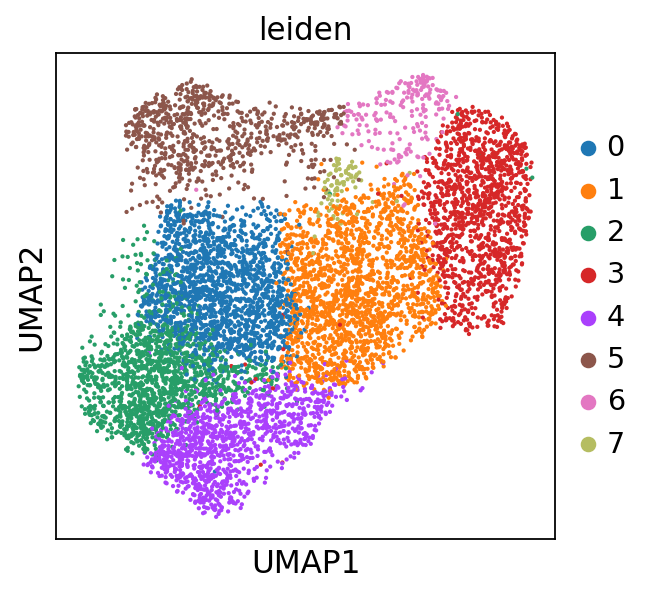

In [7]:
sc.pl.umap(adata, color='leiden')

## Look which signatures are enriched in the different clusters

In [8]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


In [9]:
# which genes are enriched in which groups
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
enrichment_clusters = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'pvals_adj', 'logfoldchanges']})
#.head(5)

In [10]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7
0,Rps9,Dut,Ftl1,Hmgb2,Ctla2a,Serpina3g,Cxcl10,Tmsb4x
1,Rpl18a,Lig1,Ifitm1,Ube2c,Ifngr1,Cxcl10,Parp14,Tyrobp
2,Rpl10,Tyms,Jund,Cdca8,Tsc22d3,Rsad2,Irf1,Ap3s1
3,Rpl32,Ppia,Hlf,Nusap1,Plaur,Iigp1,Gbp5,Taldo1
4,Ogt,Ran,Malat1,Ccnb2,Cebpb,Serpina3f,Iigp1,Lgals1
5,Rps18,Ranbp1,Rps14,Cenpf,Neurl3,Ifit1,Cd69,Tspo
6,Rpl17,Dctpp1,Rpl21,Cks2,Gm10076,Isg15,Usp18,Fcer1g
7,Rps11,Ybx1,Fos,Birc5,Cytip,Igtp,Gbp7,Clec12a
8,Rps14,Gmnn,Cd63,Mki67,Pde4b,Gbp5,Igtp,Ctsg
9,Rpl18,Uhrf1,Ier2,Tubb4b,Stk17b,Ifi203,Isg15,Rab44


In [11]:
enrichment_clusters.to_csv('./write/all_MPP_clusters_names.csv', index=False, header=True)

### Reactome

In [12]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['0_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-72689,4.358091e-66,98,41,0.418367,Formation of a pool of free 40S subunits
REAC:R-MMU-1799339,4.358091e-66,89,40,0.449438,SRP-dependent cotranslational protein targeting to membrane
REAC:R-MMU-975956,9.284903e-66,91,40,0.439560,Nonsense Mediated Decay (NMD) independent of the Exon Junction Complex (EJC)
REAC:R-MMU-156827,1.743595e-64,108,41,0.379630,L13a-mediated translational silencing of Ceruloplasmin expression
REAC:R-MMU-72706,2.230561e-64,109,41,0.376147,GTP hydrolysis and joining of the 60S ribosomal subunit
REAC:R-MMU-72737,3.680681e-63,116,41,0.353448,Cap-dependent Translation Initiation
REAC:R-MMU-72613,3.680681e-63,116,41,0.353448,Eukaryotic Translation Initiation
REAC:R-MMU-927802,1.086319e-61,112,40,0.357143,Nonsense-Mediated Decay (NMD)
REAC:R-MMU-975957,1.086319e-61,112,40,0.357143,Nonsense Mediated Decay (NMD) enhanced by the Exon Junction Complex (EJC)


In [13]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['1_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-1640170,5.654415e-17,554,32,0.057762,Cell Cycle
REAC:R-MMU-69306,6.718379e-16,121,18,0.148760,DNA Replication
REAC:R-MMU-69278,7.968267e-16,488,29,0.059426,"Cell Cycle, Mitotic"
REAC:R-MMU-68962,2.012355e-14,29,11,0.379310,Activation of the pre-replicative complex
REAC:R-MMU-69239,5.410649e-14,113,16,0.141593,Synthesis of DNA
REAC:R-MMU-69242,8.204435e-14,141,17,0.120567,S Phase
REAC:R-MMU-176187,1.332189e-13,35,11,0.314286,Activation of ATR in response to replication stress
REAC:R-MMU-69190,9.250312e-13,20,9,0.450000,DNA strand elongation
REAC:R-MMU-69186,8.450994e-12,16,8,0.500000,Lagging Strand Synthesis


In [14]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['2_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-72737,5.519479e-15,116,15,0.129310,Cap-dependent Translation Initiation
REAC:R-MMU-72613,5.519479e-15,116,15,0.129310,Eukaryotic Translation Initiation
REAC:R-MMU-1799339,5.519479e-15,89,14,0.157303,SRP-dependent cotranslational protein targeting to membrane
REAC:R-MMU-72706,5.519479e-15,109,15,0.137615,GTP hydrolysis and joining of the 60S ribosomal subunit
REAC:R-MMU-156827,5.519479e-15,108,15,0.138889,L13a-mediated translational silencing of Ceruloplasmin expression
REAC:R-MMU-975956,5.519479e-15,91,14,0.153846,Nonsense Mediated Decay (NMD) independent of the Exon Junction Complex (EJC)
REAC:R-MMU-72689,1.327767e-14,98,14,0.142857,Formation of a pool of free 40S subunits
REAC:R-MMU-927802,7.166303e-14,112,14,0.125000,Nonsense-Mediated Decay (NMD)
REAC:R-MMU-975957,7.166303e-14,112,14,0.125000,Nonsense Mediated Decay (NMD) enhanced by the Exon Junction Complex (EJC)


In [15]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['3_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-69278,2.332078e-45,488,48,0.098361,"Cell Cycle, Mitotic"
REAC:R-MMU-1640170,1.166467e-44,554,49,0.088448,Cell Cycle
REAC:R-MMU-68886,3.107225e-39,373,41,0.109920,M Phase
REAC:R-MMU-68877,1.841631e-37,185,33,0.178378,Mitotic Prometaphase
REAC:R-MMU-2500257,3.378769e-37,115,29,0.252174,Resolution of Sister Chromatid Cohesion
REAC:R-MMU-68882,1.610092e-30,188,29,0.154255,Mitotic Anaphase
REAC:R-MMU-2555396,1.623920e-30,189,29,0.153439,Mitotic Metaphase and Anaphase
REAC:R-MMU-2467813,1.465989e-29,180,28,0.155556,Separation of Sister Chromatids
REAC:R-MMU-9648025,1.701255e-29,103,24,0.233010,EML4 and NUDC in mitotic spindle formation


In [16]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['4_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-975956,5.531040e-07,91,9,0.098901,Nonsense Mediated Decay (NMD) independent of the Exon Junction Complex (EJC)
REAC:R-MMU-1799339,5.531040e-07,89,9,0.101124,SRP-dependent cotranslational protein targeting to membrane
REAC:R-MMU-72689,7.174318e-07,98,9,0.091837,Formation of a pool of free 40S subunits
REAC:R-MMU-72706,1.008068e-06,109,9,0.082569,GTP hydrolysis and joining of the 60S ribosomal subunit
REAC:R-MMU-927802,1.008068e-06,112,9,0.080357,Nonsense-Mediated Decay (NMD)
REAC:R-MMU-975957,1.008068e-06,112,9,0.080357,Nonsense Mediated Decay (NMD) enhanced by the Exon Junction Complex (EJC)
REAC:R-MMU-156827,1.008068e-06,108,9,0.083333,L13a-mediated translational silencing of Ceruloplasmin expression
REAC:R-MMU-72737,1.068460e-06,116,9,0.077586,Cap-dependent Translation Initiation
REAC:R-MMU-72613,1.068460e-06,116,9,0.077586,Eukaryotic Translation Initiation


In [17]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['5_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-913531,3.826637e-08,63,8,0.126984,Interferon Signaling
REAC:R-MMU-1169410,3.494078e-07,32,6,0.187500,Antiviral mechanism by IFN-stimulated genes
REAC:R-MMU-1169408,5.366397e-06,27,5,0.185185,ISG15 antiviral mechanism
REAC:R-MMU-168256,1.062258e-04,1737,21,0.012090,Immune System
REAC:R-MMU-1280215,2.008995e-03,515,10,0.019417,Cytokine Signaling in Immune system
REAC:R-MMU-909733,3.554448e-03,23,3,0.130435,Interferon alpha/beta signaling
REAC:R-MMU-168928,5.315500e-03,30,3,0.100000,DDX58/IFIH1-mediated induction of interferon-alpha/beta
REAC:R-MMU-8983711,5.315500e-03,6,2,0.333333,OAS antiviral response
REAC:R-MMU-1280218,5.315500e-03,736,11,0.014946,Adaptive Immune System


In [18]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['6_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-913531,0.000055,63,6,0.095238,Interferon Signaling
REAC:R-MMU-1169410,0.000055,32,5,0.156250,Antiviral mechanism by IFN-stimulated genes
REAC:R-MMU-1169408,0.000604,27,4,0.148148,ISG15 antiviral mechanism
REAC:R-MMU-69278,0.000697,488,11,0.022541,"Cell Cycle, Mitotic"
REAC:R-MMU-68877,0.001130,185,7,0.037838,Mitotic Prometaphase
REAC:R-MMU-69620,0.001491,280,8,0.028571,Cell Cycle Checkpoints
REAC:R-MMU-1640170,0.001491,554,11,0.019856,Cell Cycle
REAC:R-MMU-68886,0.001521,373,9,0.024129,M Phase
REAC:R-MMU-69478,0.004688,5,2,0.400000,G2/M DNA replication checkpoint


In [19]:
sources = ["REAC"]

pathway_enrich(enrichment_clusters['7_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
REAC:R-MMU-6798695,1.527915e-10,517,24,0.046422,Neutrophil degranulation
REAC:R-MMU-168249,1.729756e-09,976,30,0.030738,Innate Immune System
REAC:R-MMU-168256,1.586917e-08,1737,38,0.021877,Immune System
REAC:R-MMU-2022377,3.027370e-04,15,4,0.266667,Metabolism of Angiotensinogen to Angiotensins
REAC:R-MMU-3299685,3.870016e-03,29,4,0.137931,Detoxification of Reactive Oxygen Species
REAC:R-MMU-2980736,4.657029e-03,60,5,0.083333,Peptide hormone metabolism
REAC:R-MMU-9609523,9.119809e-03,16,3,0.187500,Insertion of tail-anchored proteins into the endoplasmic reticulum membrane


In [20]:
sources = ["REAC"]
pathway_enrich_genes(enrichment_clusters['7_n'].tolist(), sources)

,name,p_value,term_size,recall,intersections
native,,,,,
REAC:R-MMU-6798695,Neutrophil degranulation,1.527915e-10,517,0.046422,"[Tyrobp, Fcer1g, Ctsg, Rab44, Plac8, Cst3, Atp8b4, Mpo, Cyba, Npc2, Ctsz, Anxa2, Ms4a3, Hvcn1, Atp6ap2, Ostf1, Man2b1, Slpi, Gm2a, Cotl1, Gpi1, S100a11, Lamtor2, Ddost]"
REAC:R-MMU-168249,Innate Immune System,1.729756e-09,976,0.030738,"[Tyrobp, Fcer1g, Ctsg, Rab44, Plac8, Hsp90b1, Cst3, Atp8b4, Mpo, Cyba, Npc2, Ctsz, Anxa2, Arpc3, Actr3, Ms4a3, Hvcn1, Atp6ap2, Ostf1, Man2b1, Slpi, Gm2a, Cotl1, Gpi1, S100a11, Arpc1b, Ms4a2, Atox1, Lamtor2, Ddost]"
REAC:R-MMU-168256,Immune System,1.586917e-08,1737,0.021877,"[Tyrobp, Fcer1g, Ctsg, Rab44, Plac8, Hsp90b1, Calr, Cst3, Atp8b4, Pdia3, Mpo, Cyba, Npc2, Ctsz, Anxa2, Arpc3, Hspa5, Actr3, Ms4a3, Itgb7, Hvcn1, Atp6ap2, Ostf1, Man2b1, Slpi, Gm2a, Cotl1, Gpi1, Csf2rb, P4hb, S100a11, Arpc1b, Ms4a2, Atox1, Ankrd12, Lamtor2, Ddost, Ifngr1]"
REAC:R-MMU-2022377,Metabolism of Angiotensinogen to Angiotensins,3.027370e-04,15,0.266667,"[Ctsg, Ctsz, Atp6ap2, Cpa3]"
REAC:R-MMU-3299685,Detoxification of Reactive Oxygen Species,3.870016e-03,29,0.137931,"[Gsr, Cyba, P4hb, Gpx1]"
REAC:R-MMU-2980736,Peptide hormone metabolism,4.657029e-03,60,0.083333,"[Ctsg, Ctsz, Atp6ap2, Cpa3, Sec11c]"
REAC:R-MMU-9609523,Insertion of tail-anchored proteins into the endoplasmic reticulum membrane,9.119809e-03,16,0.187500,"[Sec61g, Sec61b, Serp1]"


### GO database

In [21]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['0_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0003735,2.618982e-66,176,44,0.250000,structural constituent of ribosome
GO:0006412,2.355780e-44,636,48,0.075472,translation
GO:0043043,5.270634e-44,656,48,0.073171,peptide biosynthetic process
GO:0005198,2.436645e-41,612,44,0.071895,structural molecule activity
GO:0043604,8.275587e-41,771,48,0.062257,amide biosynthetic process
GO:0006518,3.407101e-40,799,48,0.060075,peptide metabolic process
GO:0043603,5.797140e-35,1036,48,0.046332,cellular amide metabolic process
GO:1901566,7.938085e-32,1625,53,0.032615,organonitrogen compound biosynthetic process
GO:0002181,2.095953e-29,99,22,0.222222,cytoplasmic translation


In [22]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['1_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0006260,2.575992e-33,241,31,0.128631,DNA replication
GO:0006259,1.437233e-28,846,41,0.048463,DNA metabolic process
GO:0046483,5.961372e-22,5476,74,0.013514,heterocycle metabolic process
GO:0006139,7.560016e-22,5340,73,0.013670,nucleobase-containing compound metabolic process
GO:0006725,8.601627e-22,5549,74,0.013336,cellular aromatic compound metabolic process
GO:0006974,4.279085e-21,762,33,0.043307,cellular response to DNA damage stimulus
GO:0034641,4.279085e-21,6099,76,0.012461,cellular nitrogen compound metabolic process
GO:0006261,4.279085e-21,129,19,0.147287,DNA-dependent DNA replication
GO:1901360,4.941106e-21,5749,74,0.012872,organic cyclic compound metabolic process


In [23]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['2_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0003735,2.793868e-16,176,17,0.096591,structural constituent of ribosome
GO:1901576,4.413096e-11,5689,57,0.010019,organic substance biosynthetic process
GO:0006518,4.413096e-11,799,23,0.028786,peptide metabolic process
GO:0006412,4.413096e-11,636,21,0.033019,translation
GO:0044249,4.413096e-11,5587,57,0.010202,cellular biosynthetic process
GO:0009058,4.413096e-11,5785,57,0.009853,biosynthetic process
GO:0009059,4.413096e-11,4766,52,0.010911,macromolecule biosynthetic process
GO:0043043,6.376384e-11,656,21,0.032012,peptide biosynthetic process
GO:0048534,7.658524e-11,928,24,0.025862,hematopoietic or lymphoid organ development


In [24]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['3_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0007049,1.899155e-63,1723,76,0.044109,cell cycle
GO:0051301,2.876359e-63,566,57,0.100707,cell division
GO:0000278,4.182776e-63,852,63,0.073944,mitotic cell cycle
GO:1903047,9.156716e-60,657,57,0.086758,mitotic cell cycle process
GO:0022402,7.054621e-59,1125,65,0.057778,cell cycle process
GO:0000280,8.963425e-47,405,43,0.106173,nuclear division
GO:0007059,8.340010e-46,325,40,0.123077,chromosome segregation
GO:0140014,1.121348e-44,257,37,0.143969,mitotic nuclear division
GO:0048285,1.516302e-44,459,43,0.093682,organelle fission


In [25]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['4_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0003735,4.395313e-09,176,12,0.068182,structural constituent of ribosome
GO:0042773,1.308396e-05,64,7,0.109375,ATP synthesis coupled electron transport
GO:0043043,1.308396e-05,656,16,0.024390,peptide biosynthetic process
GO:0006412,1.308396e-05,636,16,0.025157,translation
GO:0008137,1.667025e-05,29,5,0.172414,NADH dehydrogenase (ubiquinone) activity
GO:0050136,1.667025e-05,29,5,0.172414,NADH dehydrogenase (quinone) activity
GO:0003954,1.776864e-05,31,5,0.161290,NADH dehydrogenase activity
GO:0006518,1.942164e-05,799,17,0.021277,peptide metabolic process
GO:0006119,1.942164e-05,117,8,0.068376,oxidative phosphorylation


In [26]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['5_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0051707,4.957652e-45,1483,60,0.040459,response to other organism
GO:0043207,4.957652e-45,1486,60,0.040377,response to external biotic stimulus
GO:0009607,1.075839e-44,1516,60,0.039578,response to biotic stimulus
GO:0044419,1.484454e-43,1683,61,0.036245,interspecies interaction between organisms
GO:0006952,8.437864e-39,1639,57,0.034777,defense response
GO:0098542,1.464230e-38,1090,50,0.045872,defense response to other organism
GO:0045087,1.039255e-37,805,45,0.055901,innate immune response
GO:0006955,5.271677e-35,1644,54,0.032847,immune response
GO:0009605,2.981719e-34,2829,64,0.022623,response to external stimulus


In [27]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['6_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0043207,1.146655e-36,1486,54,0.036339,response to external biotic stimulus
GO:0051707,1.146655e-36,1483,54,0.036413,response to other organism
GO:0044419,1.347962e-36,1683,56,0.033274,interspecies interaction between organisms
GO:0009607,1.633084e-36,1516,54,0.035620,response to biotic stimulus
GO:0045087,1.068386e-34,805,43,0.053416,innate immune response
GO:0098542,1.932113e-34,1090,47,0.043119,defense response to other organism
GO:0006952,1.802582e-32,1639,52,0.031727,defense response
GO:0006955,7.689825e-29,1644,49,0.029805,immune response
GO:0009615,1.003949e-28,320,29,0.090625,response to virus


In [28]:
sources = ["GO:MF","GO:BP"]

pathway_enrich(enrichment_clusters['7_n'].tolist(), sources)

,p_value,term_size,intersection_size,recall,name
native,,,,,
GO:0006950,0.000001,3776,41,0.010858,response to stress
GO:0065008,0.000004,3876,40,0.010320,regulation of biological quality
GO:0010033,0.000004,3375,37,0.010963,response to organic substance
GO:0016667,0.000026,56,6,0.107143,"oxidoreductase activity, acting on a sulfur group of donors"
GO:0015037,0.000026,12,4,0.333333,peptide disulfide oxidoreductase activity
GO:0034976,0.000041,241,10,0.041494,response to endoplasmic reticulum stress
GO:0019834,0.000067,5,3,0.600000,phospholipase A2 inhibitor activity
GO:0015036,0.000067,40,5,0.125000,disulfide oxidoreductase activity
GO:0006952,0.000075,1639,23,0.014033,defense response


# Make some plots

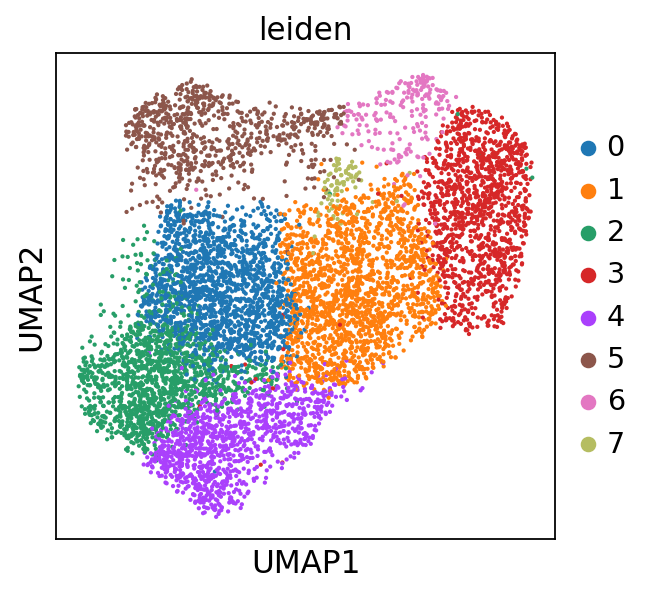

In [29]:
sc.pl.umap(adata, color='leiden')

In [30]:
# rename cluster categories
adata.rename_categories('leiden', ['Primed', 'Metabolism', 'Progenitor', 'Cell-cycle', 'Acute-Activation', 
                                   'Interferon', 'Interferon cell-cycle','Myeloid'])
# rename LT with HSC

HSPC_renaming = {'LT': 'HSC'} # dictionary for renaming
adata.obs = adata.obs.replace(HSPC_renaming)

In [31]:
adata.uns['leiden_colors']

array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b',
       '#e377c2', '#b5bd61'], dtype=object)

In [32]:
# reassign colors

adata.uns['leiden_colors'] = ['#b5bd61', '#279e68', '#1f77b4','#8c564b', '#d62728',
                              '#aa40fc', '#e377c2',  'tab:cyan']

adata.uns['sample_colors'] = ['#A6ACAF', '#2E86C1', '#28B463', '#EC7063', '#884EA0']

adata.uns['assignment_colors'] = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey' ]

... storing 'assignment' as categorical


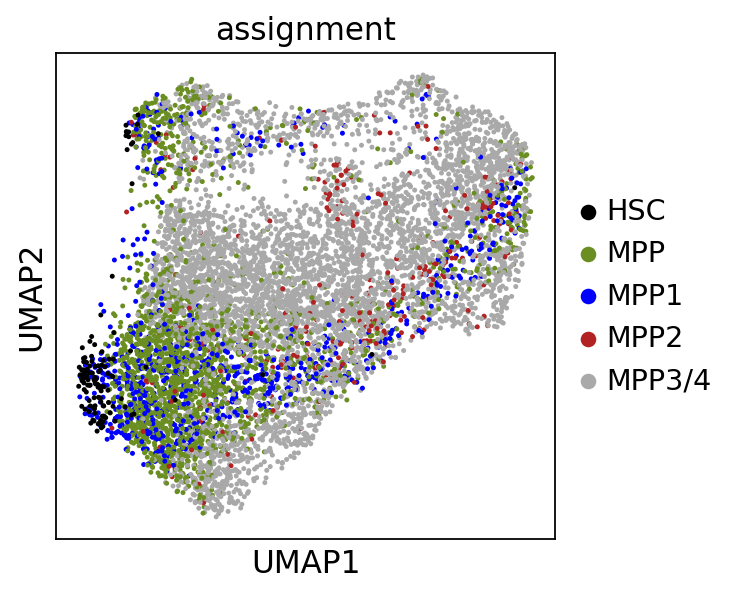

In [33]:
sc.pl.umap(adata, color='assignment',size=20, wspace=0.4)

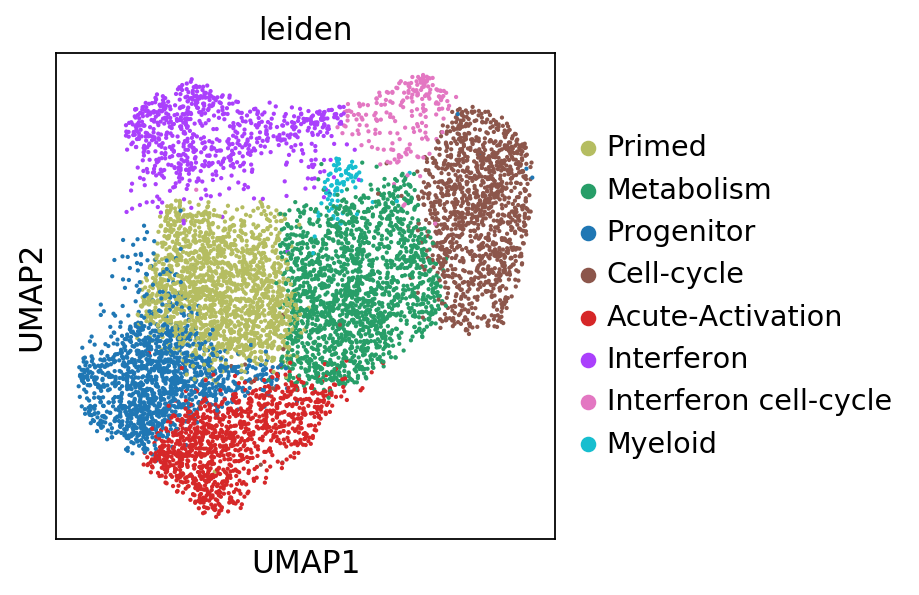

In [34]:
# sc.pl.umap(adata, color='leiden', size=20, frameon=True, save='newLTallsamples_umap.pdf')
sc.pl.umap(adata, color='leiden', frameon=True, save='_MPPallsamples_umap.pdf')

In [35]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(10)

,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
0,Rps9,Dut,Ftl1,Hmgb2,Ctla2a,Serpina3g,Cxcl10,Tmsb4x
1,Rpl18a,Lig1,Ifitm1,Ube2c,Ifngr1,Cxcl10,Parp14,Tyrobp
2,Rpl10,Tyms,Jund,Cdca8,Tsc22d3,Rsad2,Irf1,Ap3s1
3,Rpl32,Ppia,Hlf,Nusap1,Plaur,Iigp1,Gbp5,Taldo1
4,Ogt,Ran,Malat1,Ccnb2,Cebpb,Serpina3f,Iigp1,Lgals1
5,Rps18,Ranbp1,Rps14,Cenpf,Neurl3,Ifit1,Cd69,Tspo
6,Rpl17,Dctpp1,Rpl21,Cks2,Gm10076,Isg15,Usp18,Fcer1g
7,Rps11,Ybx1,Fos,Birc5,Cytip,Igtp,Gbp7,Clec12a
8,Rps14,Gmnn,Cd63,Mki67,Pde4b,Gbp5,Igtp,Ctsg
9,Rpl18,Uhrf1,Ier2,Tubb4b,Stk17b,Ifi203,Isg15,Rab44


In [36]:
# which genes are enriched in which groups
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
enrichment_clusters = pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'pvals_adj', 'logfoldchanges']})
#.head(5)

In [37]:
enrichment_clusters.to_csv('./write/all_LSK_clusters_final.csv', index=False, header=True)

In [38]:
marker_dic = {'Acute-Activation': ['Fosl2', 'Pde4b','Pde4d', 'Pde10a'],
              'Primed': ['Cd34', 'Cd37', 'Sox4', 'Flt3'],
              'Progenitor': ['Nr4a1', 'Mllt3', 'Hlf', 'Meis1'],
              'Interferon': ['Iigp1','Isg15','Ifit1', 'Oasl2'],
              'Metabolism': ['Eif5a', 'Hsp90aa1','Nop56', 'Nme1'],
              'Cell cycle': ['Mki67' ,'Top2a', 'Cdk1', 'Spc24'],
              'Myeloid': ['Fcer1g' ,'Mpo', 'Ctsg', 'Cebpa' ]
              }

# other markers 'Cst3'

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: Primed, Metabolism, Progenitor, etc.
var_group_labels: Acute-Activation, Primed, Progenitor, etc.


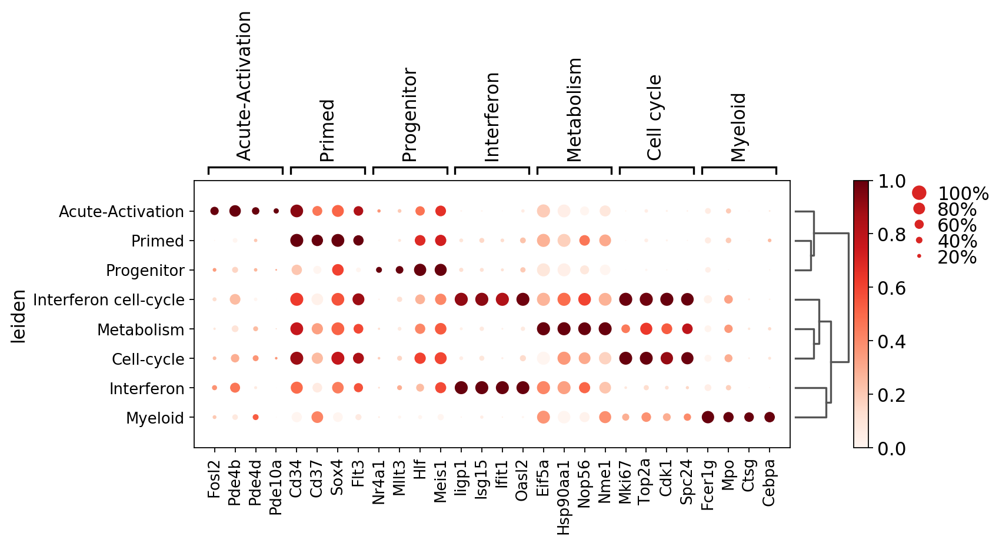

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[8.25, 0.8, 0.2, 0.5, 0.25])

In [39]:
sc.pl.dotplot(adata, marker_dic, groupby='leiden',standard_scale='var', figsize = (10, 4), dendrogram=True, save='_MPP_clusters.pdf')


In [40]:
lin_tf = {'HSC': ['Runx1', 'Tal1','Lmo2', 'Bmi1', 'Gfi1', 'Gata2'],
                'Erythroid': ['Klf1', 'Gata1'],
              'Mega': ['Fli1', 'Nfe2',  'Gata1'],
              'Myeloid': ['Cebpa', 'Cebpa','Spi1', 'Gfi1'],
              'T-cell': [ 'Gata3', 'Runx3', 'Batf', 'Notch1', 'Zbtb7b', 'Tcf3', 'Ikzf1', 'Spi1',],
              'B-cell': ['Zbtb7a', 'Ebf1', 'Bcl11a', 'Xbp1', 'Irf4',],
              }
# len review with stu orkin https://www.sciencedirect.com/science/article/pii/S0092867408001256#fig1
# this is also good for lineage markers https://www.sciencedirect.com/science/article/pii/S1934590907002202#mmc3

categories: Primed, Metabolism, Progenitor, etc.
var_group_labels: HSC, Erythroid, Mega, etc.


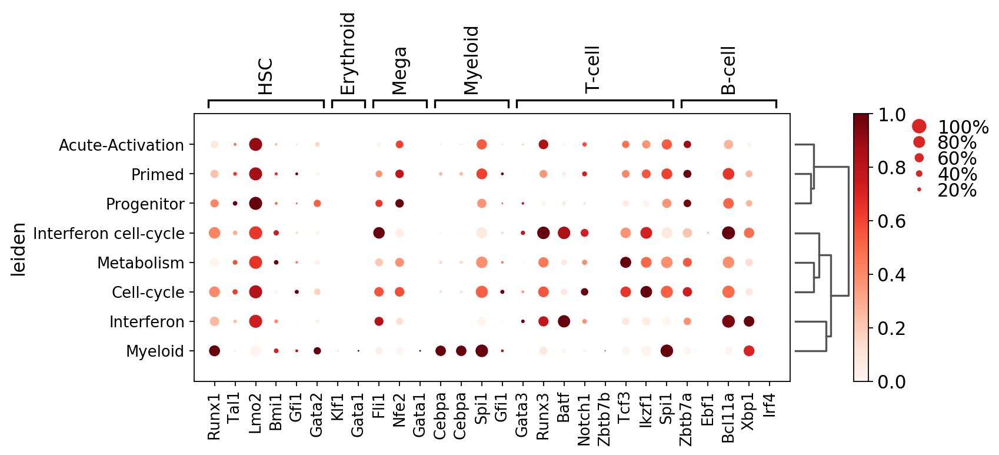

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[8.25, 0.8, 0.2, 0.5, 0.25])

In [41]:
sc.pl.dotplot(adata, lin_tf, groupby='leiden',standard_scale='var', figsize = (10, 4), dendrogram=True)

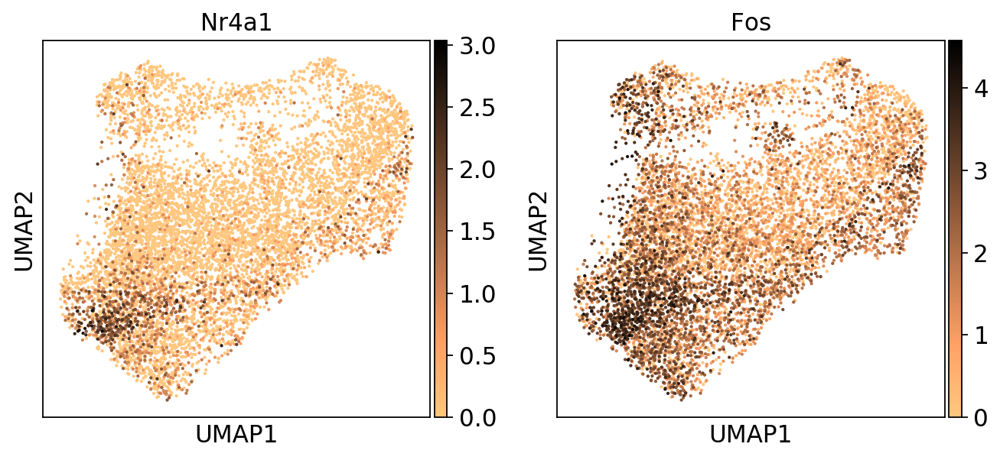

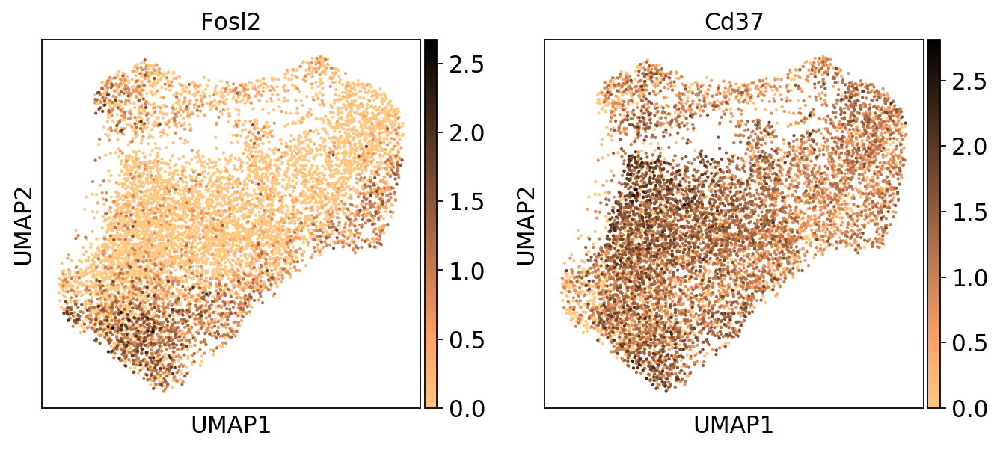

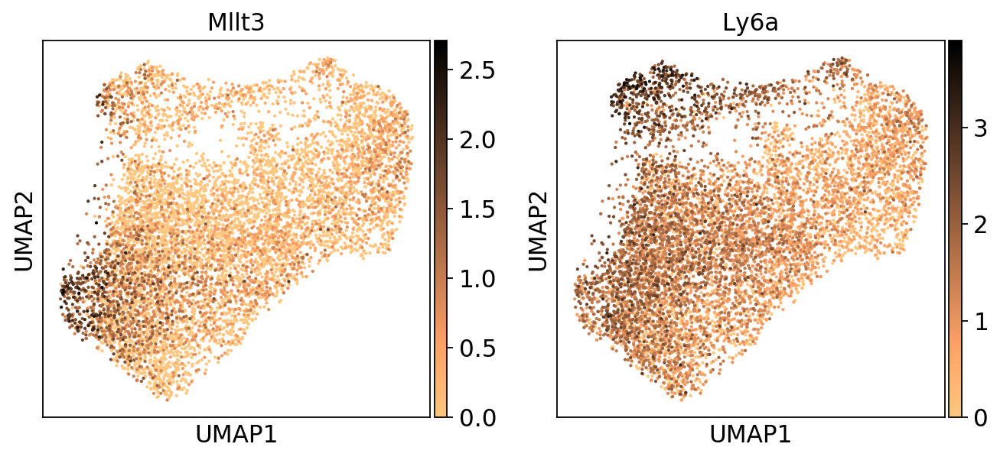

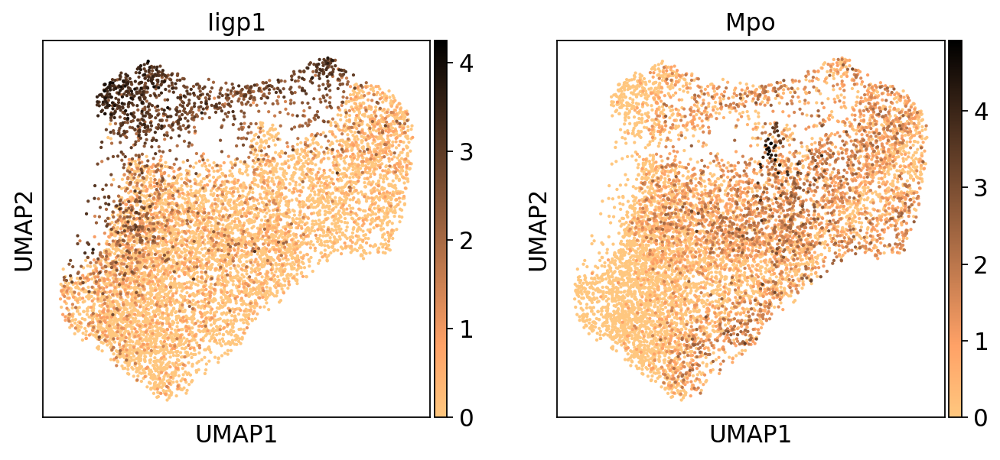

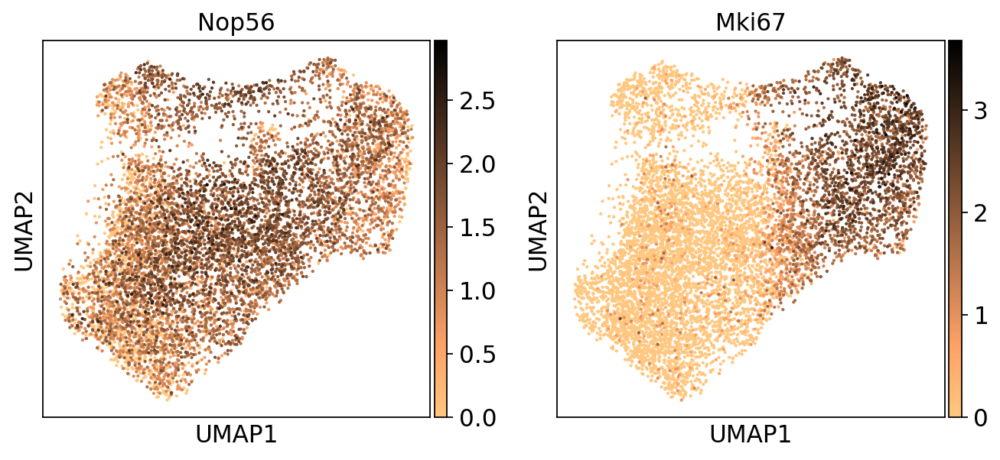

In [42]:
# Markers for cluster

sc.pl.umap(adata, color = ['Nr4a1', 'Fos'], cmap = 'copper_r', save='_MPP_Nr4a1_Fos.pdf')
sc.pl.umap(adata, color = ['Fosl2', 'Cd37'], cmap = 'copper_r', save='_MPP_Fosl2_Cd37.pdf')
sc.pl.umap(adata, color = ['Mllt3', 'Ly6a'], cmap = 'copper_r', save='_MPP_Mllt3_Ly6a.pdf')
sc.pl.umap(adata, color = ['Iigp1', 'Mpo'], cmap = 'copper_r', save='_MPP_Iigp1_Mpo.pdf')
sc.pl.umap(adata, color = ['Nop56', 'Mki67'], cmap = 'copper_r', save='_MPP_Nop56_Mki67.pdf')

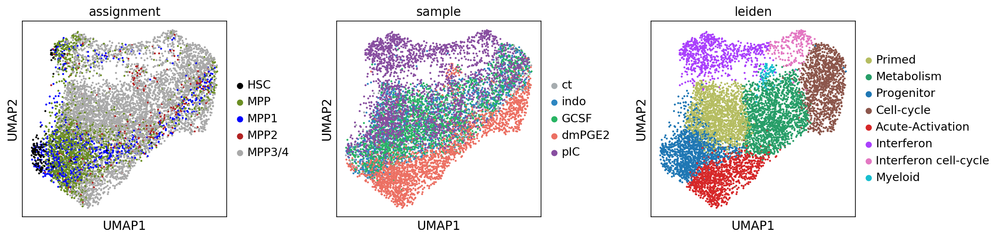

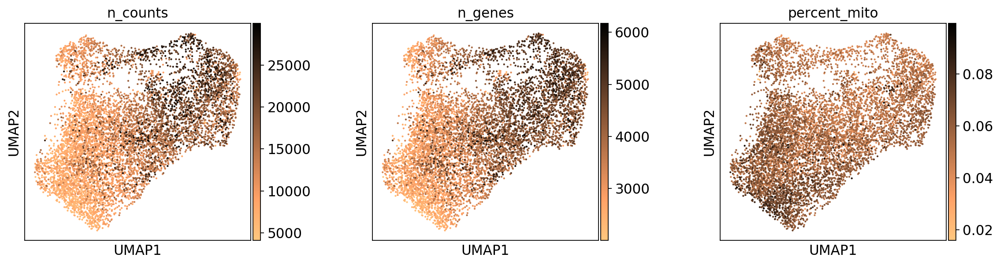

In [43]:
sc.pl.umap(adata, color=['assignment', 'sample', 'leiden'],size=20, wspace=0.4, save='_MPP_assignment_sample_leiden.pdf')
sc.pl.umap(adata, color=["n_counts", 'n_genes', 'percent_mito'], wspace=0.4, cmap = 'copper_r', save='_MPP_n_counts_n_genes_percent_mito.pdf')

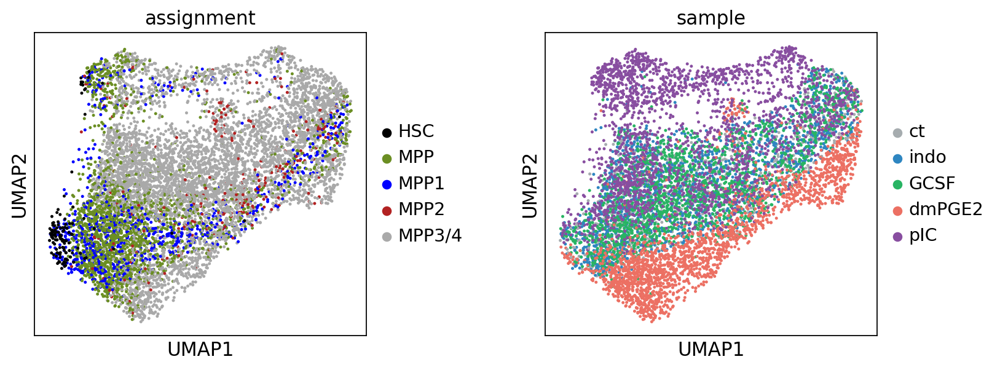

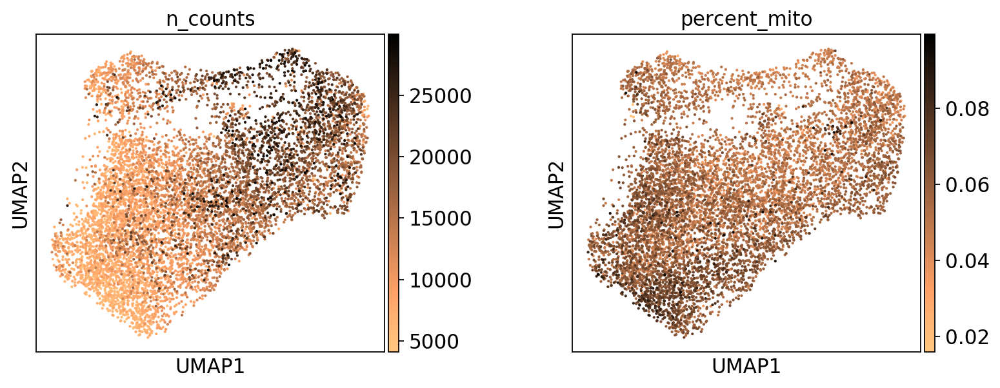

In [44]:
sc.pl.umap(adata, color=['assignment', 'sample'],size=20, wspace=0.4, save='_MPP_assignment_sample.pdf')
sc.pl.umap(adata, color=["n_counts", 'percent_mito'], wspace=0.4, cmap = 'copper_r', save='_MPP_n_counts_percent_mito.pdf')

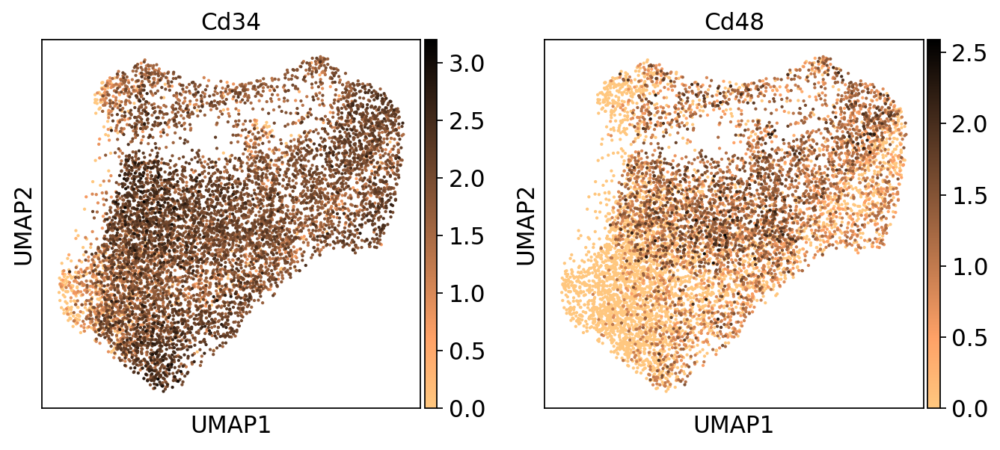

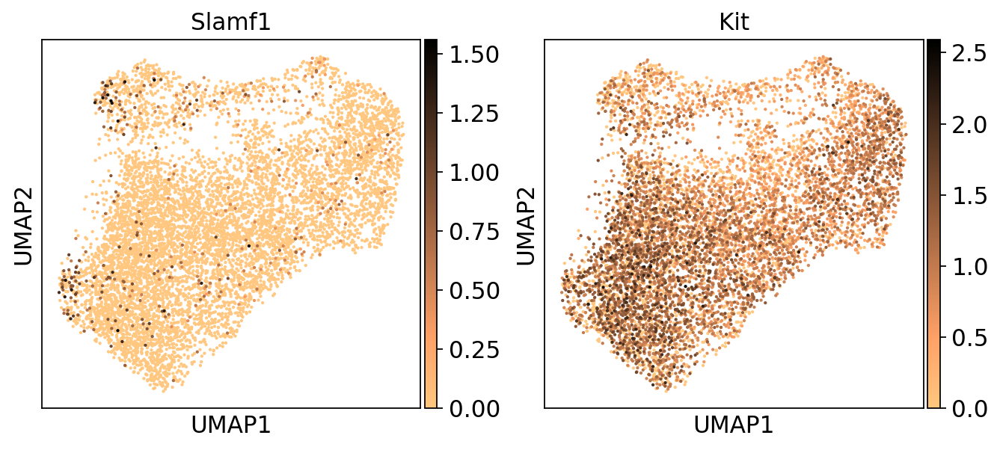

In [45]:
sc.pl.umap(adata, color = ['Cd34', 'Cd48'], cmap = 'copper_r', save='_MPP_Cd34_Cd48.pdf')
sc.pl.umap(adata, color = ['Slamf1', 'Kit'], cmap = 'copper_r', save='_MPP_Slamf1_Kit.pdf')

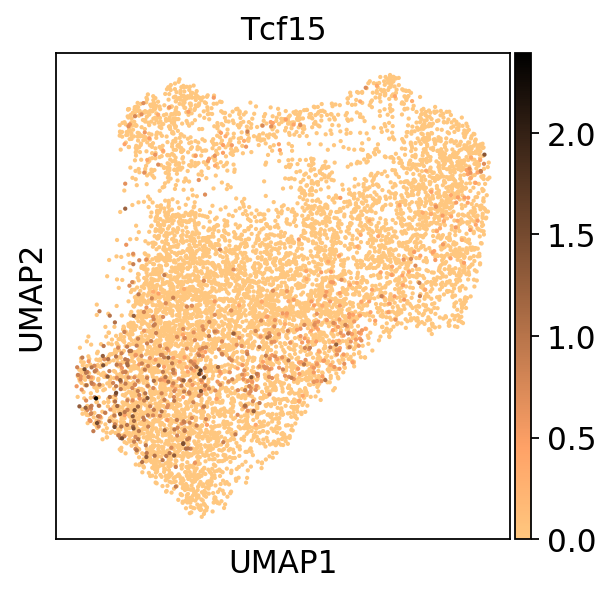

In [46]:
sc.pl.umap(adata, color = ['Tcf15'], cmap = 'copper_r')

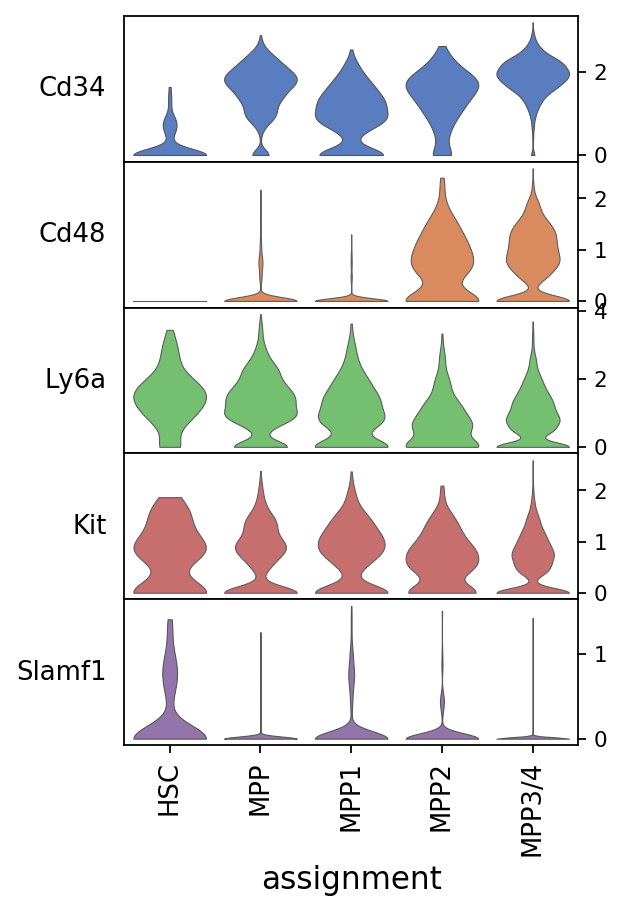

In [47]:
sc.pl.stacked_violin(adata, ['Cd34', 'Cd48', 'Ly6a', 'Kit', 'Slamf1'], figsize=(4,6), 
                     log=False, swap_axes=True, groupby='assignment', save='_MPP_violingplot.pdf')

## Relationship of clusters and cells from drug treatments

1) Distribution of cells between clusters for each treatment  
2) Distribution of drug treatments within clusters  
3) How are the surface MPPs distributed between the treatments  
4) How are clusters distributed within surface MPPs (is there a difference between treatments)  
5) How are the surface MPPs distributed within between clusters (is there a difference between treatments)
6) Which surface phenotypes make up the induced clusters (Activated for dmPGE2 and Interferon for pIC)

### 1) Distribution of cells between clusters for each treatment  

In [48]:
abs_v = pd.pivot_table(adata.obs, values='sex_sample', index=['leiden'],columns=['sample'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.to_csv('./write/MPP_leiden_within_treatment.csv', index=True, header=True)
abs_v

sample,ct,indo,GCSF,dmPGE2,pIC
leiden,,,,,
Primed,246.0,459.0,549.0,31.0,439.0
Metabolism,223.0,385.0,458.0,334.0,315.0
Progenitor,237.0,388.0,420.0,140.0,246.0
Cell-cycle,148.0,236.0,251.0,373.0,211.0
Acute-Activation,8.0,5.0,10.0,1073.0,0.0
Interferon,2.0,13.0,4.0,1.0,713.0
Interferon cell-cycle,0.0,1.0,1.0,0.0,196.0
Myeloid,2.0,4.0,9.0,40.0,20.0


In [49]:
percent_abs_v = abs_v.iloc[:,0:6].div(abs_v.sum(axis=0), axis=1)
percent_abs_v

sample,ct,indo,GCSF,dmPGE2,pIC
leiden,,,,,
Primed,0.284065,0.307847,0.322562,0.015562,0.205140
Metabolism,0.257506,0.258216,0.269095,0.167671,0.147196
Progenitor,0.273672,0.260228,0.246769,0.070281,0.114953
Cell-cycle,0.170901,0.158283,0.147474,0.187249,0.098598
Acute-Activation,0.009238,0.003353,0.005875,0.538655,0.000000
Interferon,0.002309,0.008719,0.002350,0.000502,0.333178
Interferon cell-cycle,0.000000,0.000671,0.000588,0.000000,0.091589
Myeloid,0.002309,0.002683,0.005288,0.020080,0.009346


In [50]:
percent_abs_v.index.tolist()

['Primed',
 'Metabolism',
 'Progenitor',
 'Cell-cycle',
 'Acute-Activation',
 'Interferon',
 'Interferon cell-cycle',
 'Myeloid']

In [51]:
# reindex
percent_abs_v = percent_abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

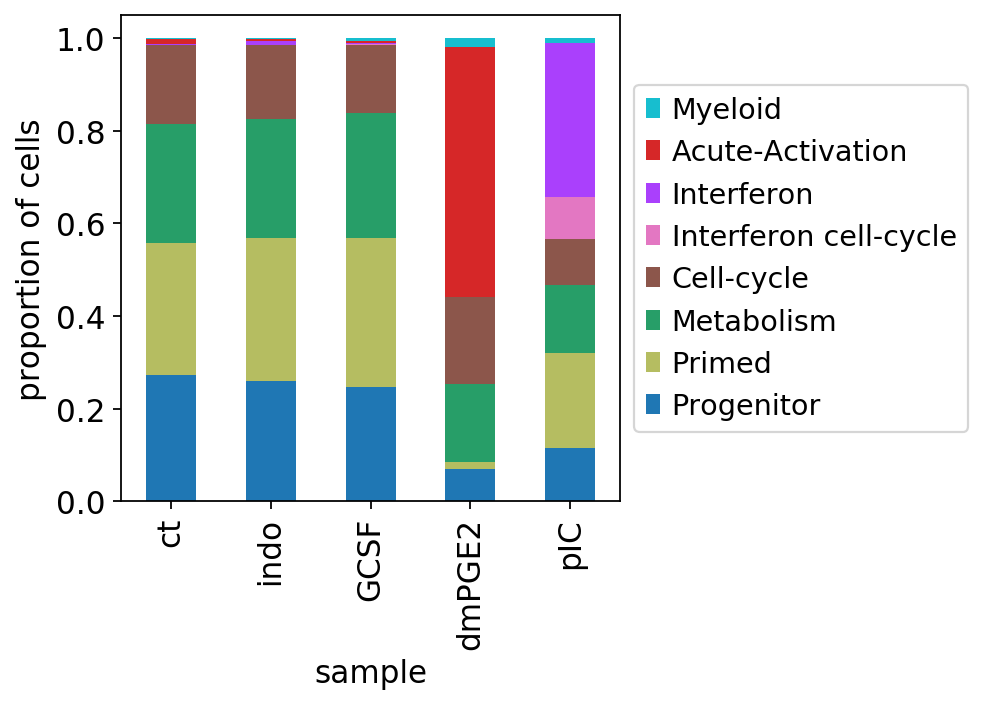

In [52]:
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
#, figsize=(3, 3)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_treatment.pdf', bbox_inches = "tight")

### 2) Distribution of drug treatments within clusters

In [53]:
abs_v_c = pd.pivot_table(adata.obs, values='sex_sample', index=['sample'],columns=['leiden'], aggfunc=[len])
abs_v_c = abs_v_c.fillna(0) #replaces all NaNs with 0
abs_v_c.columns = abs_v_c.columns.droplevel(0) # drops columnlevel (=len)
abs_v_c.to_csv('./write/MPP_treatment_within_leiden.csv', index=True, header=True)
abs_v_c

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
sample,,,,,,,,
ct,246.0,223.0,237.0,148.0,8.0,2.0,0.0,2.0
indo,459.0,385.0,388.0,236.0,5.0,13.0,1.0,4.0
GCSF,549.0,458.0,420.0,251.0,10.0,4.0,1.0,9.0
dmPGE2,31.0,334.0,140.0,373.0,1073.0,1.0,0.0,40.0
pIC,439.0,315.0,246.0,211.0,0.0,713.0,196.0,20.0


In [54]:
abs_v_c_norm = abs_v_c.iloc[0:5,:].div(abs_v_c.sum(axis=1), axis=0) #normalize for cell numbers
abs_v_c_norm.iloc[:,0:8].div(abs_v_c_norm.sum(axis=0), axis=1)

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
sample,,,,,,,,
ct,0.250238,0.234163,0.283333,0.224131,0.016581,0.006654,0.000000,0.058164
indo,0.271189,0.234809,0.269414,0.207583,0.006019,0.025123,0.007224,0.067565
GCSF,0.284151,0.244702,0.255480,0.193407,0.010546,0.006772,0.006328,0.133175
dmPGE2,0.013709,0.152472,0.072762,0.245571,0.966853,0.001446,0.000000,0.505722
pIC,0.180712,0.133853,0.119011,0.129308,0.000000,0.960005,0.986448,0.235373


In [55]:
# define some colors to identify samples

abs_v_c_norm = abs_v_c_norm[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid']]

def_color = ['#A6ACAF', '#2E86C1', '#28B463', '#EC7063', '#884EA0']

#https://htmlcolorcodes.com/color-chart/

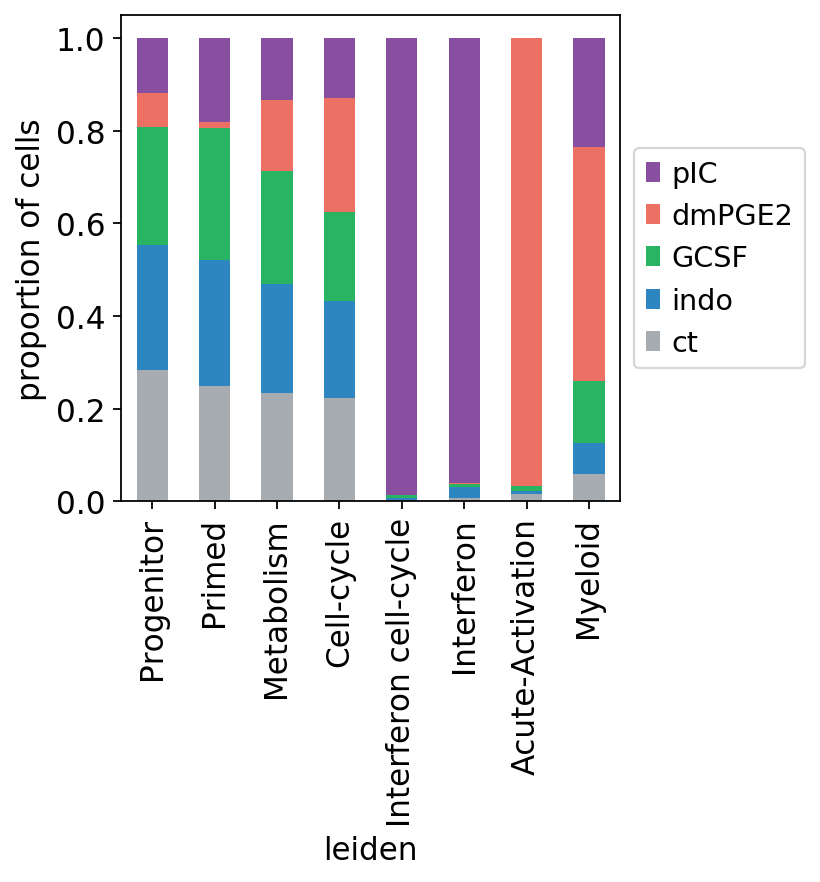

In [56]:
ax = abs_v_c_norm.iloc[:,0:8].div(abs_v_c_norm.sum(axis=0), 
                                  axis=1).T.plot.bar(stacked=True, color = def_color)
#figsize=(3, 3), 
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_treatment_within_leiden.pdf', bbox_inches = "tight")

### 3) How are the surface MPPs distributed between the treatments

In [57]:
abs_v = pd.pivot_table(adata.obs, values='sex_sample', index=['assignment'],columns=['sample'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.to_csv('./write/MPP_MPPsurf_within_treatment.csv', index=True, header=True)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v

sample,ct,indo,GCSF,dmPGE2,pIC
HSC,17,25,30,15,37
MPP,237,404,433,451,480
MPP1,77,121,155,225,200
MPP2,28,40,58,72,78
MPP3/4,507,901,1026,1229,1345


In [58]:
percent_abs_v = abs_v.iloc[:,0:6].div(abs_v.sum(axis=0), axis=1)
percent_abs_v

sample,ct,indo,GCSF,dmPGE2,pIC
HSC,0.019630,0.016767,0.017626,0.007530,0.017290
MPP,0.273672,0.270959,0.254407,0.226406,0.224299
MPP1,0.088915,0.081154,0.091069,0.112952,0.093458
MPP2,0.032333,0.026828,0.034078,0.036145,0.036449
MPP3/4,0.585450,0.604292,0.602820,0.616968,0.628505


In [59]:
# define some colors to identify samples

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

#matplotlib colors https://matplotlib.org/3.1.0/gallery/color/named_colors.html

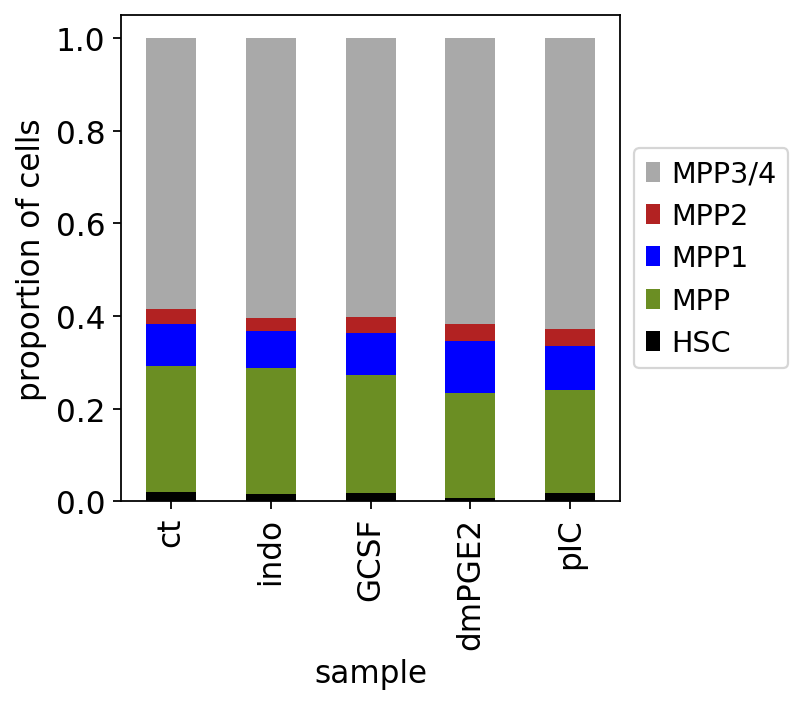

In [60]:
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
                                                                        
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_treatment.pdf', bbox_inches = "tight")

### 4) How are clusters distributed within surface MPPs (is there a difference between treatments)

In [61]:
abs_v = pd.pivot_table(adata.obs, values='sex_sample', index=['leiden'],columns=['assignment'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.columns = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_leiden_within_MPPsurf_all.csv', index=True, header=True)
abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.0,278.0,24.0,19.0,1403.0
Metabolism,1.0,157.0,113.0,100.0,1344.0
Progenitor,109.0,859.0,383.0,27.0,53.0
Cell-cycle,1.0,129.0,78.0,61.0,950.0
Acute-Activation,0.0,342.0,95.0,22.0,637.0
Interferon,13.0,226.0,73.0,19.0,402.0
Interferon cell-cycle,0.0,13.0,12.0,7.0,166.0
Myeloid,0.0,1.0,0.0,21.0,53.0


In [62]:
percent_abs_v = abs_v.iloc[:,0:5].div(abs_v.sum(axis=0), axis=1)
percent_abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.000000,0.138653,0.030848,0.068841,0.280152
Metabolism,0.008065,0.078304,0.145244,0.362319,0.268371
Progenitor,0.879032,0.428429,0.492288,0.097826,0.010583
Cell-cycle,0.008065,0.064339,0.100257,0.221014,0.189696
Acute-Activation,0.000000,0.170574,0.122108,0.079710,0.127196
Interferon,0.104839,0.112718,0.093830,0.068841,0.080272
Interferon cell-cycle,0.000000,0.006484,0.015424,0.025362,0.033147
Myeloid,0.000000,0.000499,0.000000,0.076087,0.010583


In [63]:
# reindex
percent_abs_v = percent_abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

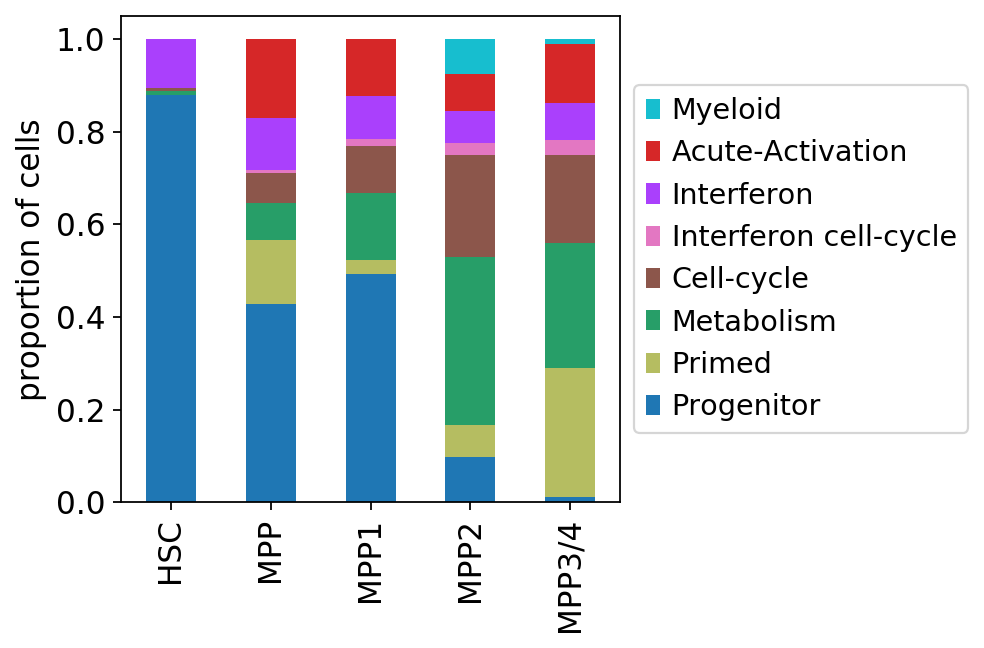

In [64]:
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_all.pdf', bbox_inches = "tight")

### 4a) ct only

In [65]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='ct'], values='sex_sample', index=['leiden'],columns=['assignment'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.columns = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_leiden_within_MPPsurf_ct.csv', index=True, header=True)
abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.0,30.0,3.0,4.0,209.0
Metabolism,0.0,25.0,15.0,10.0,173.0
Progenitor,16.0,157.0,50.0,5.0,9.0
Cell-cycle,1.0,18.0,8.0,8.0,113.0
Acute-Activation,0.0,7.0,1.0,0.0,0.0
Interferon,0.0,0.0,0.0,0.0,2.0
Myeloid,0.0,0.0,0.0,1.0,1.0


In [66]:
# reindex
abs_v = abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

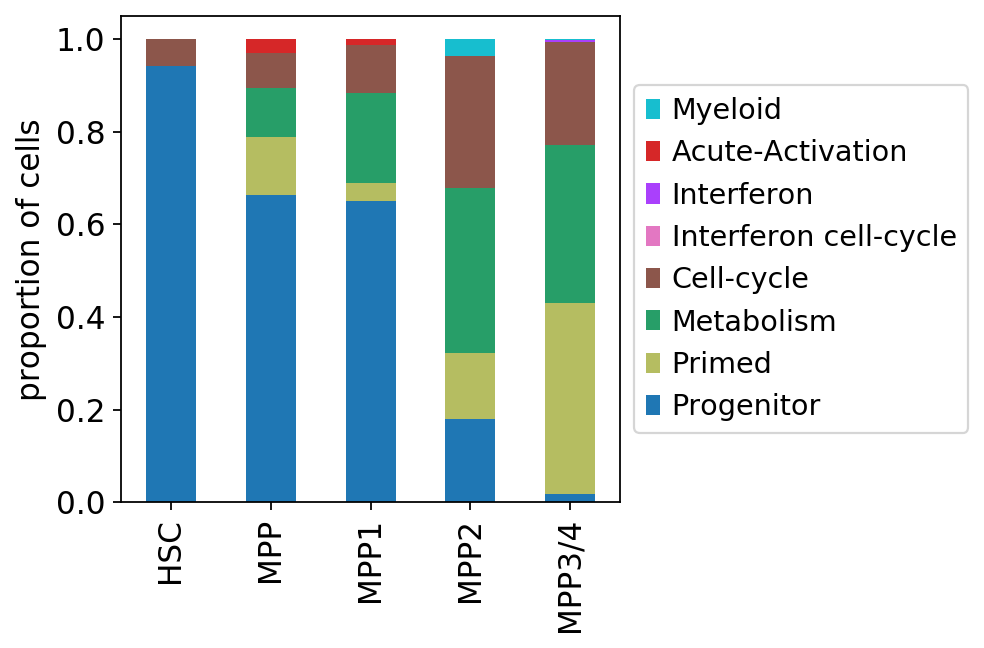

In [67]:
percent_abs_v = abs_v.iloc[:,0:5].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_ct.pdf', bbox_inches = "tight")

### 4b) pIC only

In [68]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='pIC'], values='sex_sample', index=['leiden'],columns=['assignment'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.columns = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_leiden_within_MPPsurf_pIC.csv', index=True, header=True)
abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.0,79.0,10.0,6.0,344.0
Metabolism,0.0,19.0,14.0,19.0,263.0
Progenitor,24.0,131.0,73.0,10.0,8.0
Cell-cycle,0.0,16.0,19.0,10.0,166.0
Interferon,13.0,222.0,72.0,19.0,387.0
Interferon cell-cycle,0.0,13.0,12.0,7.0,164.0
Myeloid,0.0,0.0,0.0,7.0,13.0


In [69]:
# reindex
abs_v = abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

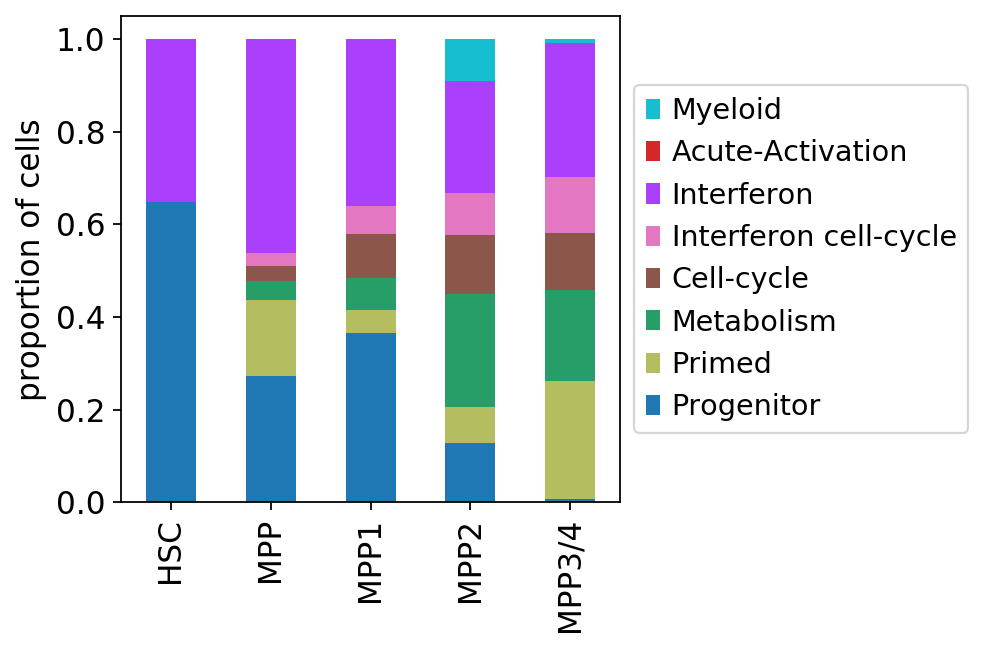

In [70]:
percent_abs_v = abs_v.iloc[:,0:5].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_pIC.pdf', bbox_inches = "tight")

### 4c) dmPGE2 only

In [71]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='dmPGE2'], values='sex_sample', index=['leiden'],columns=['assignment'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.columns = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_leiden_within_MPPsurf_dmPGE2.csv', index=True, header=True)
abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.0,3.0,1.0,0.0,27.0
Metabolism,1.0,31.0,34.0,24.0,244.0
Progenitor,14.0,49.0,70.0,2.0,5.0
Cell-cycle,0.0,46.0,26.0,13.0,288.0
Acute-Activation,0.0,322.0,94.0,22.0,635.0
Interferon,0.0,0.0,0.0,0.0,1.0
Myeloid,0.0,0.0,0.0,11.0,29.0


In [72]:
# reindex
abs_v = abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

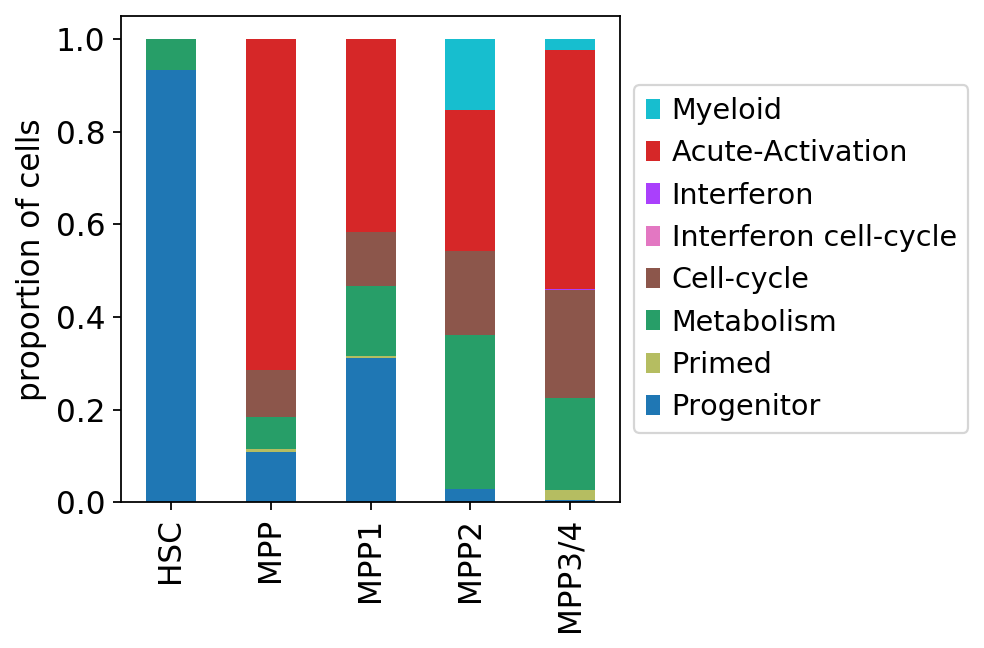

In [73]:
percent_abs_v = abs_v.iloc[:,0:5].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_dmPGE2.pdf', bbox_inches = "tight")

### 4d) indo only

In [74]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='indo'], values='sex_sample', index=['leiden'],columns=['assignment'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.columns = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_leiden_within_MPPsurf_indo.csv', index=True, header=True)
abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.0,77.0,4.0,4.0,374.0
Metabolism,0.0,35.0,18.0,21.0,311.0
Progenitor,25.0,265.0,84.0,3.0,11.0
Cell-cycle,0.0,18.0,14.0,11.0,193.0
Acute-Activation,0.0,5.0,0.0,0.0,0.0
Interferon,0.0,4.0,1.0,0.0,8.0
Interferon cell-cycle,0.0,0.0,0.0,0.0,1.0
Myeloid,0.0,0.0,0.0,1.0,3.0


In [75]:
# reindex
abs_v = abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

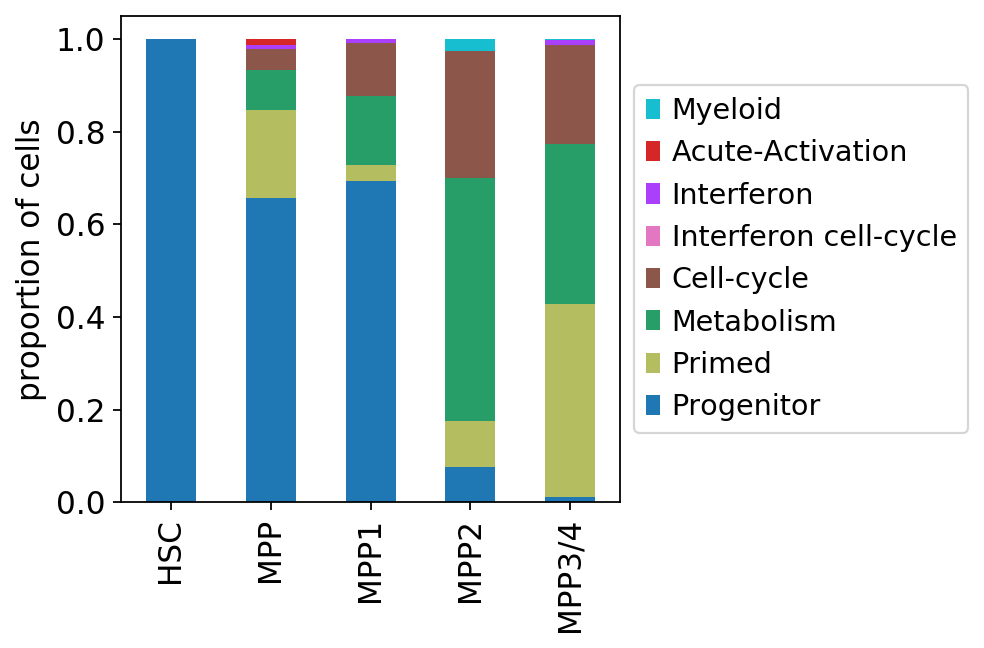

In [76]:
percent_abs_v = abs_v.iloc[:,0:5].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_indo.pdf', bbox_inches = "tight")

### 4e) GCSF only

In [77]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='GCSF'], values='sex_sample', index=['leiden'],columns=['assignment'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.columns = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_leiden_within_MPPsurf_GCSF.csv', index=True, header=True)
abs_v

,HSC,MPP,MPP1,MPP2,MPP3/4
leiden,,,,,
Primed,0.0,89.0,6.0,5.0,449.0
Metabolism,0.0,47.0,32.0,26.0,353.0
Progenitor,30.0,257.0,106.0,7.0,20.0
Cell-cycle,0.0,31.0,11.0,19.0,190.0
Acute-Activation,0.0,8.0,0.0,0.0,2.0
Interferon,0.0,0.0,0.0,0.0,4.0
Interferon cell-cycle,0.0,0.0,0.0,0.0,1.0
Myeloid,0.0,1.0,0.0,1.0,7.0


In [78]:
# reindex
abs_v = abs_v.reindex(['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid'])

def_color = ['#1f77b4','#b5bd61', '#279e68', '#8c564b', 
                               '#e377c2', '#aa40fc', '#d62728', 'tab:cyan']

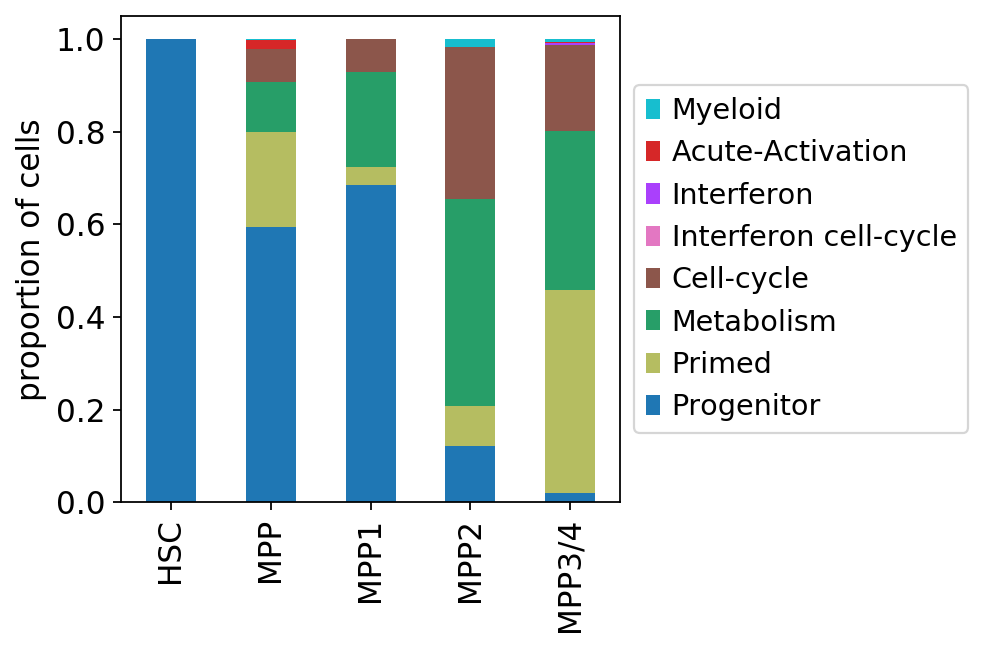

In [79]:
percent_abs_v = abs_v.iloc[:,0:5].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_GCSF.pdf', bbox_inches = "tight")

### 5) How are the surface MPPs distributed within between clusters (is there a difference between treatments)

In [80]:
abs_v = pd.pivot_table(adata.obs, values='sex_sample', index=['assignment'],columns=['leiden'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_MPPsurf_within_leiden_all.csv', index=True, header=True)
abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
HSC,0.0,1.0,109.0,1.0,0.0,13.0,0.0,0.0
MPP,278.0,157.0,859.0,129.0,342.0,226.0,13.0,1.0
MPP1,24.0,113.0,383.0,78.0,95.0,73.0,12.0,0.0
MPP2,19.0,100.0,27.0,61.0,22.0,19.0,7.0,21.0
MPP3/4,1403.0,1344.0,53.0,950.0,637.0,402.0,166.0,53.0


In [81]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
percent_abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
HSC,0.000000,0.000583,0.076171,0.000820,0.000000,0.017735,0.000000,0.000000
MPP,0.161253,0.091545,0.600280,0.105824,0.312044,0.308322,0.065657,0.013333
MPP1,0.013921,0.065889,0.267645,0.063987,0.086679,0.099591,0.060606,0.000000
MPP2,0.011021,0.058309,0.018868,0.050041,0.020073,0.025921,0.035354,0.280000
MPP3/4,0.813805,0.783673,0.037037,0.779327,0.581204,0.548431,0.838384,0.706667


In [82]:
# define some colors to identify samples
abs_v = abs_v[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid']]

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

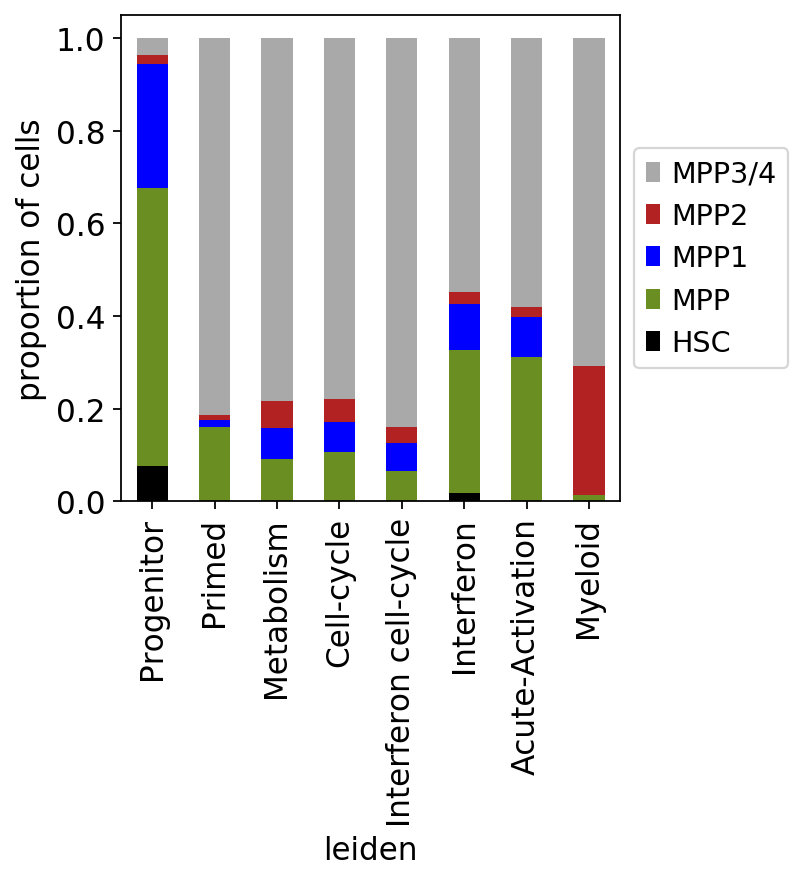

In [83]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_leiden_all.pdf', bbox_inches = "tight")

### 5a) ct only

In [84]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='ct'], values='sex_sample', index=['assignment'],columns=['leiden'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_MPPsurf_within_leiden_ct.csv', index=True, header=True)
abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Myeloid
HSC,0.0,0.0,16.0,1.0,0.0,0.0,0.0
MPP,30.0,25.0,157.0,18.0,7.0,0.0,0.0
MPP1,3.0,15.0,50.0,8.0,1.0,0.0,0.0
MPP2,4.0,10.0,5.0,8.0,0.0,0.0,1.0
MPP3/4,209.0,173.0,9.0,113.0,0.0,2.0,1.0


In [85]:
# define some colors to identify samples
abs_v = abs_v[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                        'Interferon', 'Acute-Activation','Myeloid']]

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

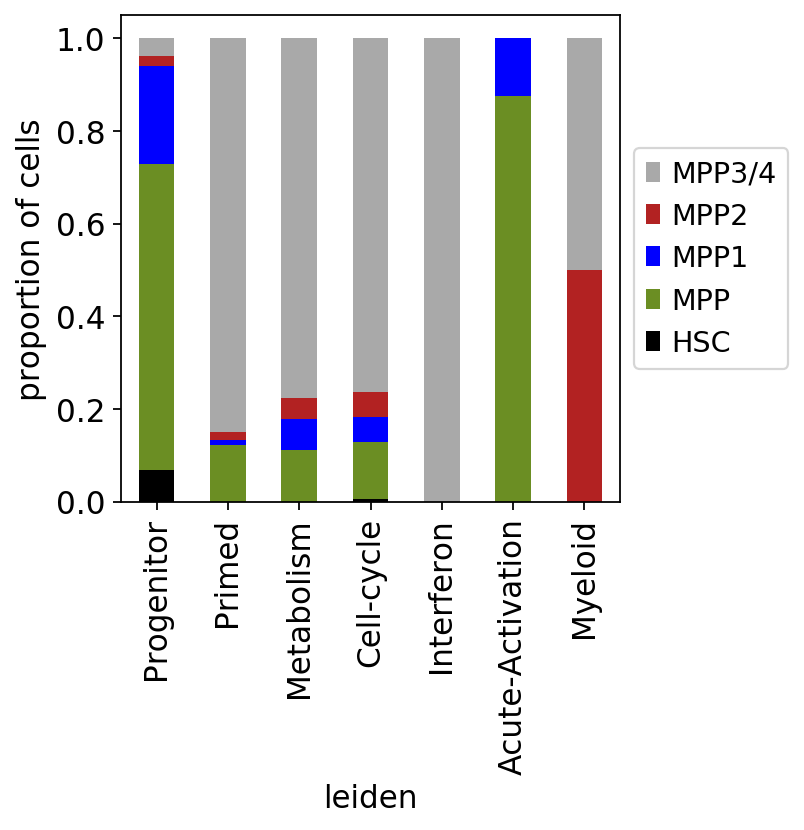

In [86]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_leiden_ct.pdf', bbox_inches = "tight")

### 5b) indo only

In [87]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='indo'], values='sex_sample', index=['assignment'],columns=['leiden'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_MPPsurf_within_leiden_indo.csv', index=True, header=True)
abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
HSC,0.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0
MPP,77.0,35.0,265.0,18.0,5.0,4.0,0.0,0.0
MPP1,4.0,18.0,84.0,14.0,0.0,1.0,0.0,0.0
MPP2,4.0,21.0,3.0,11.0,0.0,0.0,0.0,1.0
MPP3/4,374.0,311.0,11.0,193.0,0.0,8.0,1.0,3.0


In [88]:
# define some colors to identify samples
abs_v = abs_v[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid']]

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

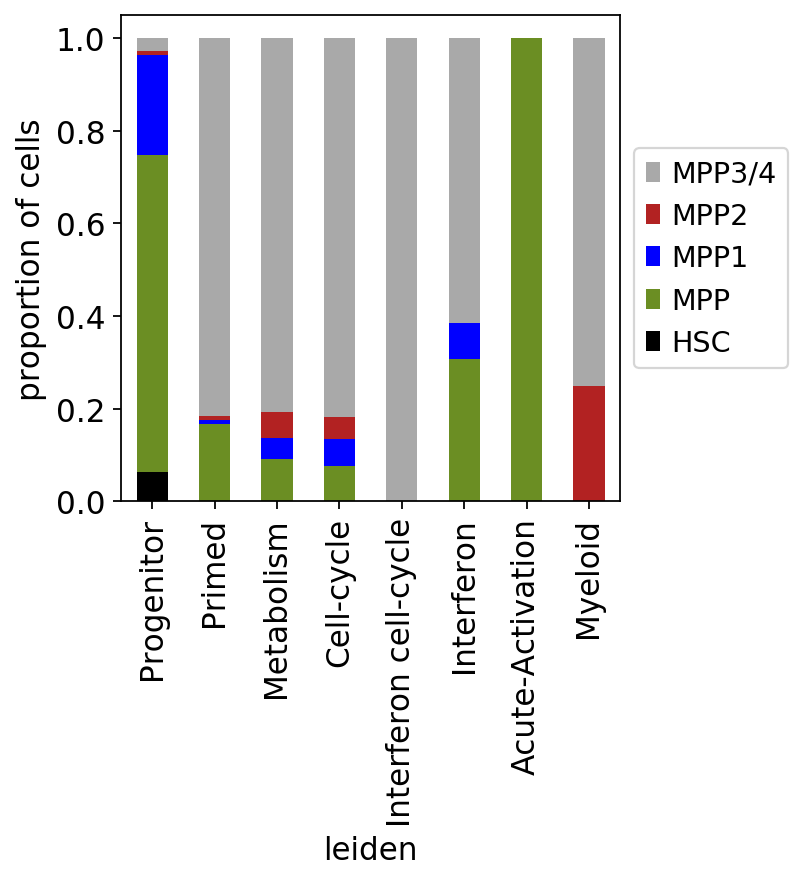

In [89]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_leiden_indo.pdf', bbox_inches = "tight")

### 5c) GCSF only

In [90]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='GCSF'], values='sex_sample', index=['assignment'],columns=['leiden'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_MPPsurf_within_leiden_GCSF.csv', index=True, header=True)
abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Interferon cell-cycle,Myeloid
HSC,0.0,0.0,30.0,0.0,0.0,0.0,0.0,0.0
MPP,89.0,47.0,257.0,31.0,8.0,0.0,0.0,1.0
MPP1,6.0,32.0,106.0,11.0,0.0,0.0,0.0,0.0
MPP2,5.0,26.0,7.0,19.0,0.0,0.0,0.0,1.0
MPP3/4,449.0,353.0,20.0,190.0,2.0,4.0,1.0,7.0


In [91]:
# define some colors to identify samples
abs_v = abs_v[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon', 'Acute-Activation','Myeloid']]

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

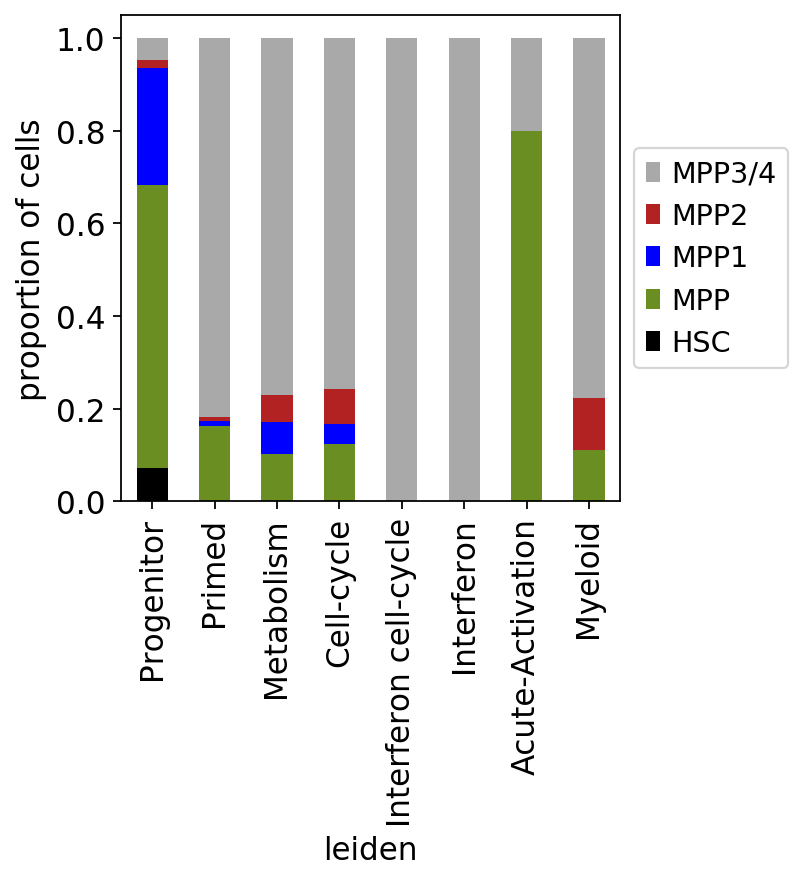

In [92]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_leiden_GCSF.pdf', bbox_inches = "tight")

### 5d) pIC only

In [93]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='pIC'], values='sex_sample', index=['assignment'],columns=['leiden'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_MPPsurf_within_leiden_pIC.csv', index=True, header=True)
abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Interferon,Interferon cell-cycle,Myeloid
HSC,0.0,0.0,24.0,0.0,13.0,0.0,0.0
MPP,79.0,19.0,131.0,16.0,222.0,13.0,0.0
MPP1,10.0,14.0,73.0,19.0,72.0,12.0,0.0
MPP2,6.0,19.0,10.0,10.0,19.0,7.0,7.0
MPP3/4,344.0,263.0,8.0,166.0,387.0,164.0,13.0


In [94]:
# define some colors to identify samples
abs_v = abs_v[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon cell-cycle', 'Interferon','Myeloid']]

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

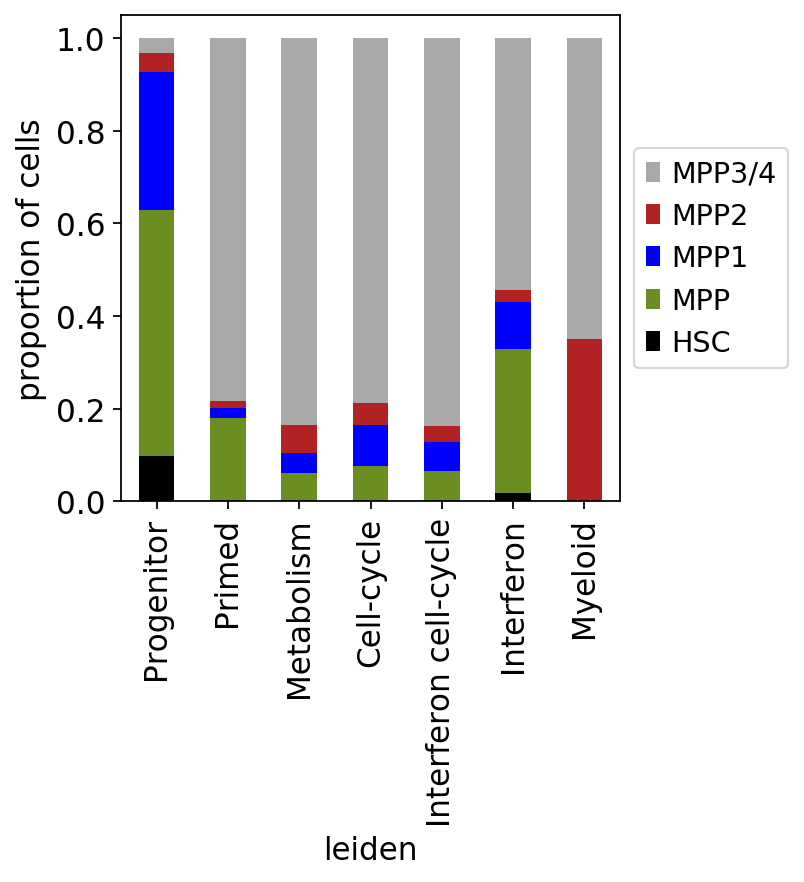

In [95]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_leiden_pIC.pdf', bbox_inches = "tight")

### 5e) dmPGE2 only

In [96]:
abs_v = pd.pivot_table(adata.obs[adata.obs['sample']=='dmPGE2'], values='sex_sample', index=['assignment'],columns=['leiden'], aggfunc=[len])
abs_v = abs_v.fillna(0) #replaces all NaNs with 0
abs_v.columns = abs_v.columns.droplevel(0) # drops columnlevel (=len)
abs_v.index = ['HSC', 'MPP', 'MPP1', 'MPP2', 'MPP3/4']
abs_v.to_csv('./write/MPP_MPPsurf_within_leiden_dmPGE2.csv', index=True, header=True)
abs_v

leiden,Primed,Metabolism,Progenitor,Cell-cycle,Acute-Activation,Interferon,Myeloid
HSC,0.0,1.0,14.0,0.0,0.0,0.0,0.0
MPP,3.0,31.0,49.0,46.0,322.0,0.0,0.0
MPP1,1.0,34.0,70.0,26.0,94.0,0.0,0.0
MPP2,0.0,24.0,2.0,13.0,22.0,0.0,11.0
MPP3/4,27.0,244.0,5.0,288.0,635.0,1.0,29.0


In [97]:
# define some colors to identify samples
abs_v = abs_v[['Progenitor', 'Primed', 'Metabolism', 'Cell-cycle', 
                                       'Interferon', 'Acute-Activation','Myeloid']]

def_color = ['k', 'olivedrab', 'blue',  'firebrick', 'darkgrey']

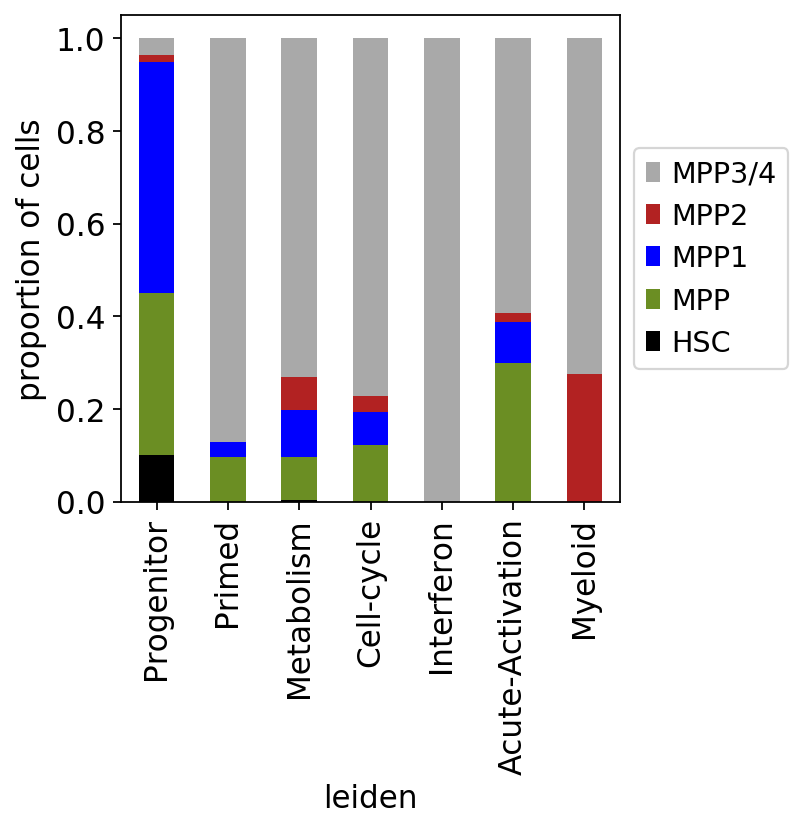

In [98]:
percent_abs_v = abs_v.iloc[:,0:8].div(abs_v.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color)

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_MPPsurf_within_leiden_dmPGE2.pdf', bbox_inches = "tight")

## 6) Surface phenotypes that make up activated clusters

In [99]:
adata.obs.head()

,assignment,batch,counts,demux_type,hto_type,rna_type,sample,select_cells,n_counts,log_counts,n_genes,percent_mito,Female,Female_cat,Female_str,sex_sample,rXist,leiden,umap_density_sample,umap_density_assignment
AAACGAAGTTGGACCC-0,MPP3/4,batch1,902.0,singlet,background,signal,ct,1.0,13508.0,9.511259,3991,0.057805,True,True,true,ct_true,3.158928,Metabolism,0.637315,0.847134
AAAGGATCACGCTGAC-0,MPP,batch1,869.0,singlet,background,signal,ct,1.0,18172.0,9.807637,4622,0.049802,True,True,true,ct_true,3.078445,Primed,0.783623,0.335968
AAAGGATGTAGTCTGT-0,MPP3/4,batch1,694.0,singlet,background,signal,ct,1.0,8688.0,9.070044,3154,0.059602,True,True,true,ct_true,3.206680,Primed,0.866588,0.514442
AAAGGGCAGCAGCGAT-0,MPP,batch1,848.0,singlet,background,signal,ct,1.0,8510.0,9.049468,2990,0.056965,False,False,false,ct_false,-0.049406,Primed,0.675819,0.257006
AAAGGTATCTTCGACC-0,MPP3/4,batch1,3446.0,singlet,signal,signal,ct,1.0,15875.0,9.672815,4302,0.046851,True,True,true,ct_true,2.978796,Cell-cycle,0.668953,0.709803


In [100]:
clusters = pd.crosstab(adata.obs['assignment'],adata.obs['leiden'])
clusters = clusters[['Acute-Activation', 'Interferon', 'Interferon cell-cycle']]

treatments = pd.crosstab(adata.obs['assignment'],adata.obs['sample'])
treatments = treatments[['dmPGE2', 'pIC']]

index_l = treatments.index.tolist()

treatments.reset_index(drop=True, inplace=True)
clusters.reset_index(drop=True, inplace=True)

treatments.index = index_l
clusters.index = index_l

treatments.columns = treatments.columns.tolist()
clusters.columns = clusters.columns.tolist()

df_ol = pd.concat([treatments, clusters], axis=1)
df_ol.to_csv('./write/MPP_MPPsurf_treatment_shift.csv', index=True, header=True)
df_ol

,dmPGE2,pIC,Acute-Activation,Interferon,Interferon cell-cycle
HSC,15,37,0,13,0
MPP,451,480,342,226,13
MPP1,225,200,95,73,12
MPP2,72,78,22,19,7
MPP3/4,1229,1345,637,402,166


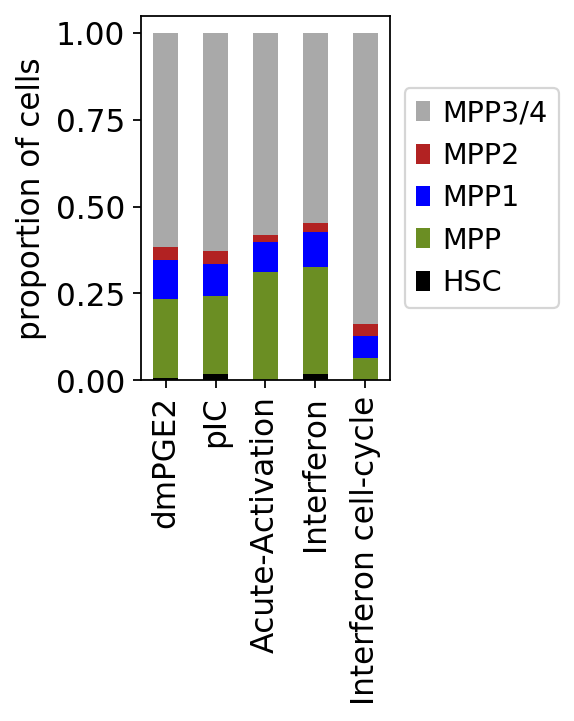

In [101]:
percent_abs_v = df_ol.iloc[:,0:5].div(df_ol.sum(axis=0), axis=1)
ax = percent_abs_v.T.plot.bar(stacked=True, color = def_color, figsize=(2, 3))

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1], loc='center left', bbox_to_anchor=(1.0, 0.5))

plt.ylabel("proportion of cells")
plt.grid(b=None) # turns off gridlines
plt.savefig('./figures/MPP_leiden_within_MPPsurf_dmPGE2.pdf', bbox_inches = "tight")

### density

computing density on 'umap'
--> added
    'umap_density_sample', densities (adata.obs)
    'umap_density_sample_params', parameter (adata.uns)


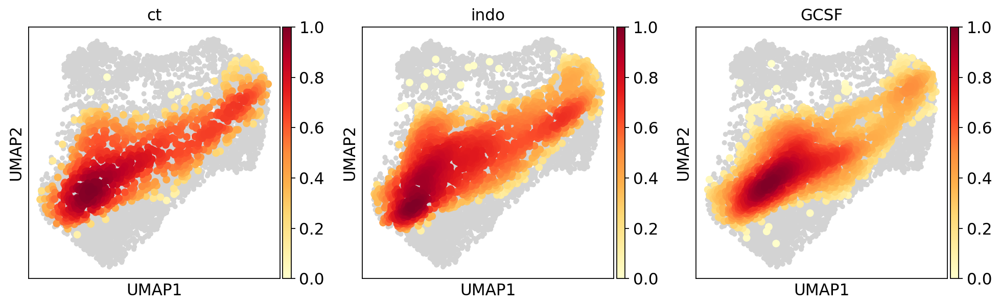

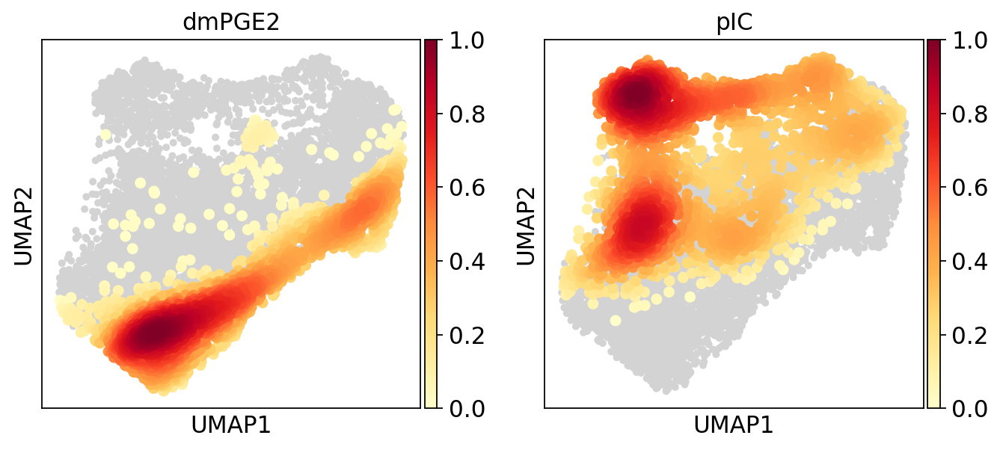

In [102]:
#by treatment

#Plot the density
sc.tl.embedding_density(adata, basis='umap', groupby='sample')

adata.obs['sample'].value_counts()
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', 
                        group=['ct','indo', 'GCSF'], save='MPP_ct_indo_GCSF.pdf')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_sample', 
                        group=['dmPGE2', 'pIC'], save='MPP_dmPGE2_pIC.pdf')

computing density on 'umap'
--> added
    'umap_density_assignment', densities (adata.obs)
    'umap_density_assignment_params', parameter (adata.uns)


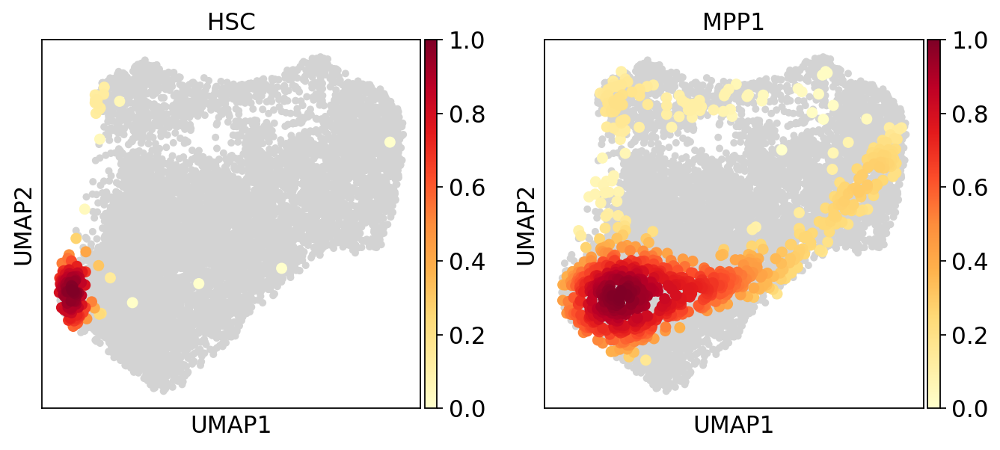

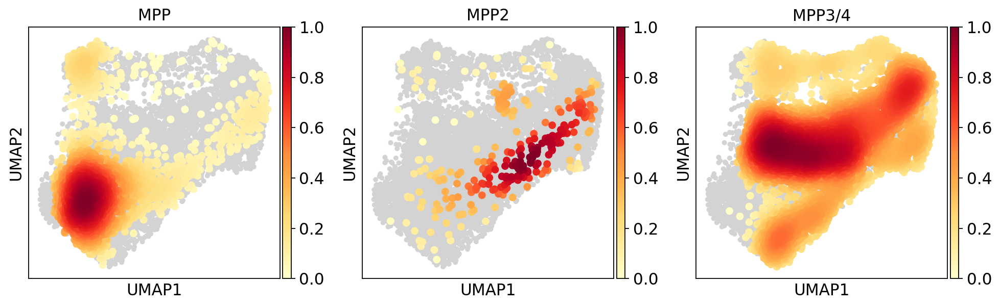

In [103]:
#by Assignment - surface marker

#Plot the density
sc.tl.embedding_density(adata, basis='umap', groupby='assignment')

adata.obs['assignment'].value_counts()
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', 
                        group=['HSC','MPP1'], save='HSC_MPP1.pdf')
sc.pl.embedding_density(adata, basis='umap', key='umap_density_assignment', 
                        group=['MPP','MPP2','MPP3/4'], save='MPP_MPP2_MPP3.pdf')

# Save enrichment as .pdf

In [104]:
# this makes a multipage pdf document
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('./figures/MPP_clusterenrichment.pdf')

sources = ["REAC"]
background_genes = adata.var_names.tolist()

In [105]:
enrichment_clusters.columns.tolist()

['Primed_n',
 'Primed_s',
 'Primed_p',
 'Primed_l',
 'Metabolism_n',
 'Metabolism_s',
 'Metabolism_p',
 'Metabolism_l',
 'Progenitor_n',
 'Progenitor_s',
 'Progenitor_p',
 'Progenitor_l',
 'Cell-cycle_n',
 'Cell-cycle_s',
 'Cell-cycle_p',
 'Cell-cycle_l',
 'Acute-Activation_n',
 'Acute-Activation_s',
 'Acute-Activation_p',
 'Acute-Activation_l',
 'Interferon_n',
 'Interferon_s',
 'Interferon_p',
 'Interferon_l',
 'Interferon cell-cycle_n',
 'Interferon cell-cycle_s',
 'Interferon cell-cycle_p',
 'Interferon cell-cycle_l',
 'Myeloid_n',
 'Myeloid_s',
 'Myeloid_p',
 'Myeloid_l']

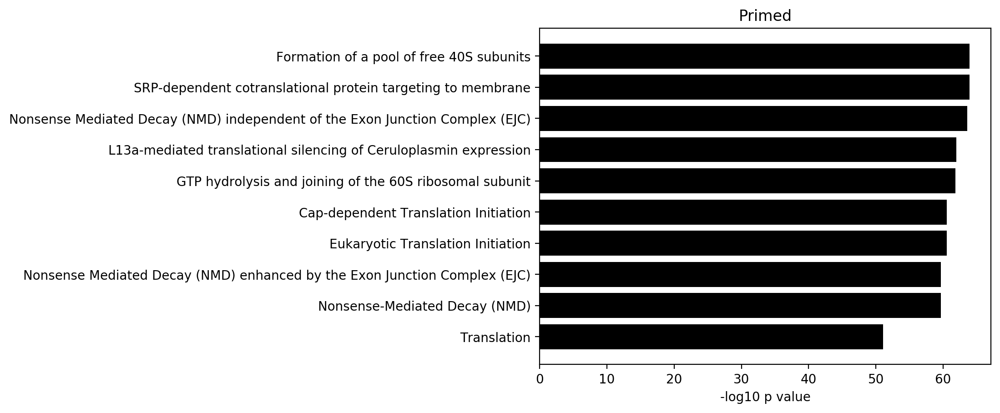

In [106]:
pathway_enrich_plot(enrichment_clusters['Primed_n'].tolist(), sources, 'Primed', background_genes, pp, save = True)

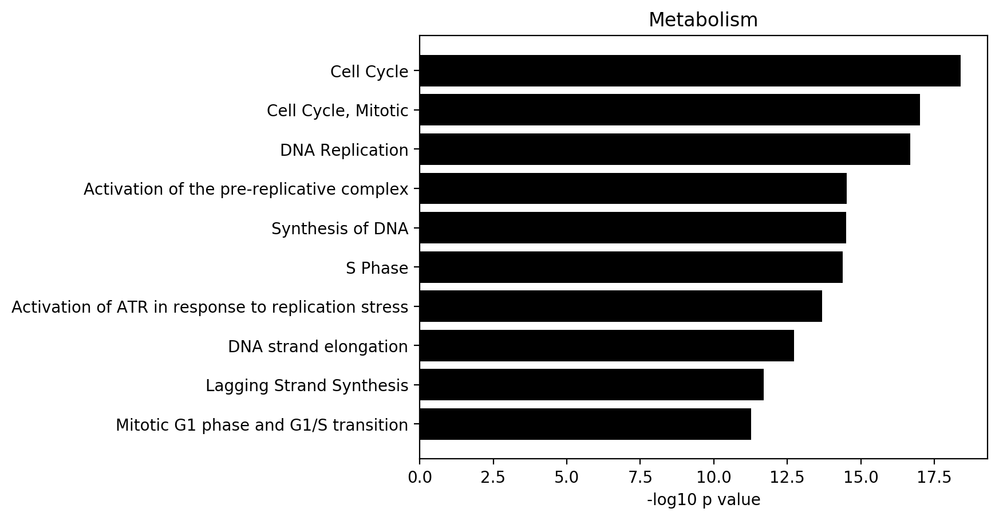

In [107]:
pathway_enrich_plot(enrichment_clusters['Metabolism_n'].tolist(), sources, 'Metabolism', background_genes, pp, save = True)

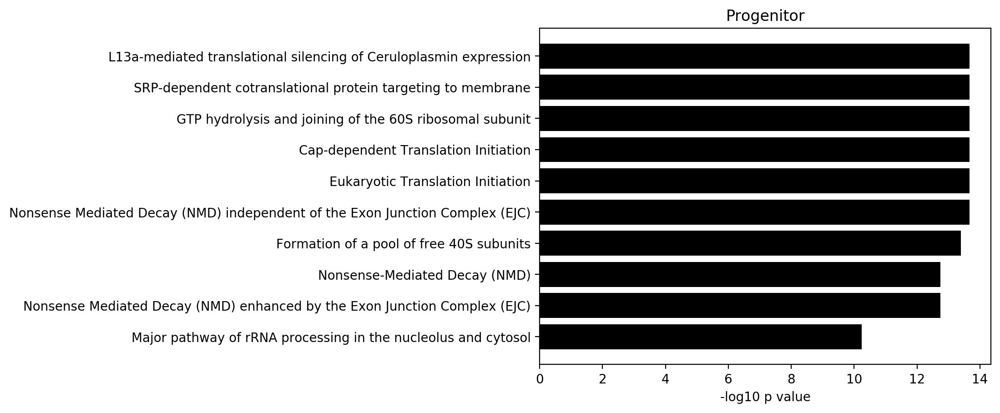

In [108]:
pathway_enrich_plot(enrichment_clusters['Progenitor_n'].tolist(), sources, 'Progenitor', background_genes, pp, save = True)

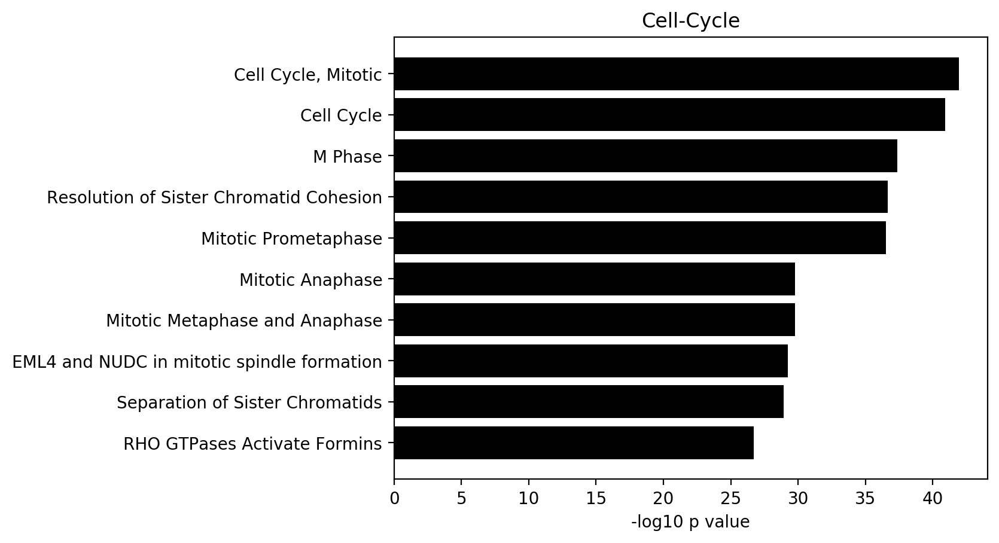

In [110]:
pathway_enrich_plot(enrichment_clusters['Cell-cycle_n'].tolist(), sources, 'Cell-Cycle', background_genes, pp, save = True)

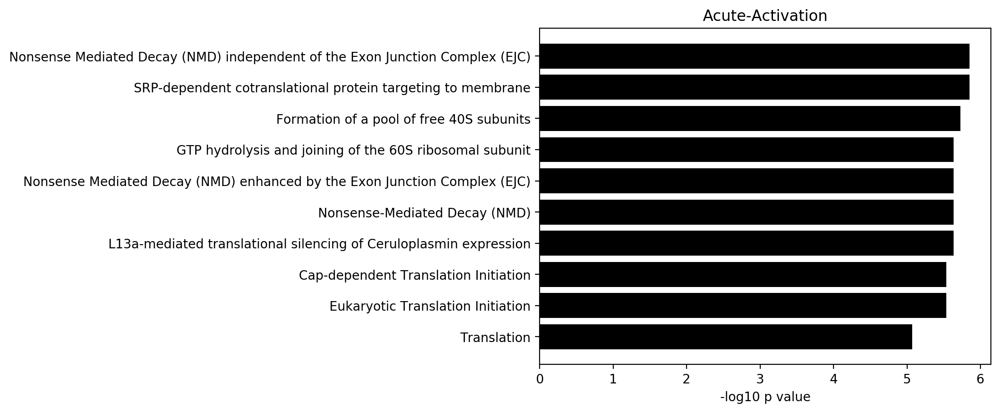

In [111]:
pathway_enrich_plot(enrichment_clusters['Acute-Activation_n'].tolist(), sources, 'Acute-Activation', background_genes, pp, save = True)

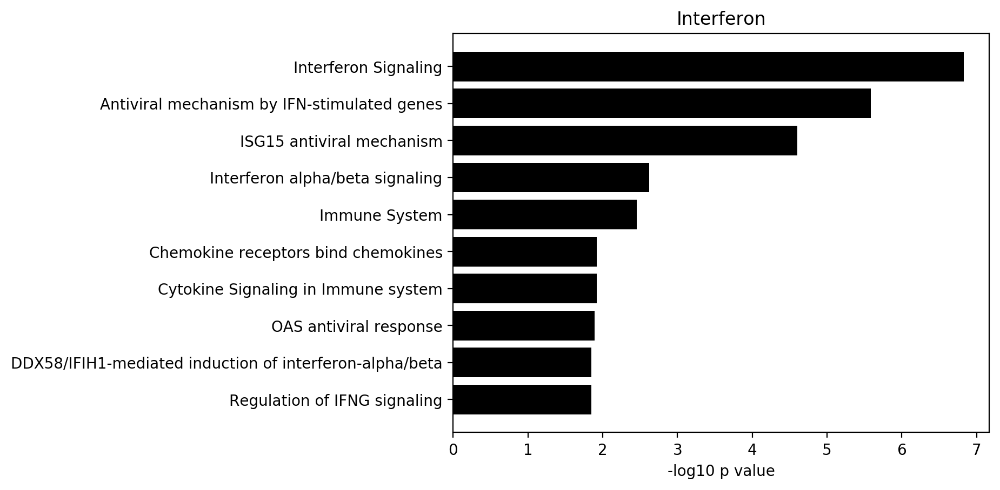

In [112]:
pathway_enrich_plot(enrichment_clusters['Interferon_n'].tolist(), sources, 'Interferon', background_genes, pp, save = True)

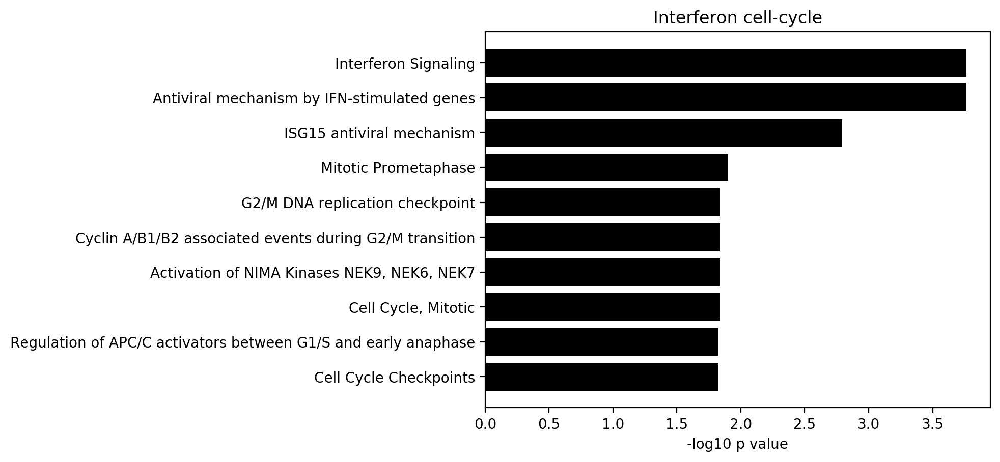

In [113]:
pathway_enrich_plot(enrichment_clusters['Interferon cell-cycle_n'].tolist(), sources, 'Interferon cell-cycle', background_genes, pp, save = True)

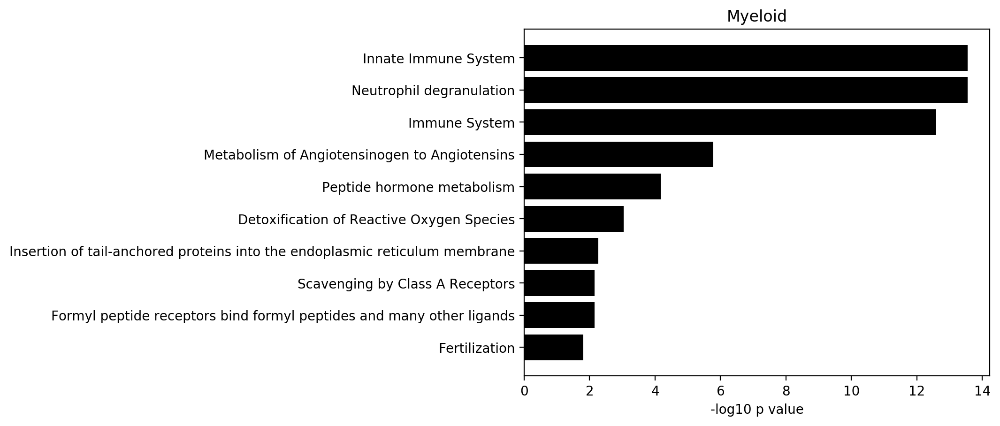

In [114]:
pathway_enrich_plot(enrichment_clusters['Myeloid_n'].tolist(), sources, 'Myeloid', background_genes, pp, save = True)

In [115]:
# close the multipage pdf
pp.close()

In [116]:
%pip list

Package                Version            
---------------------- -------------------
alembic                1.3.0              
anndata                0.7.1              
async-generator        1.10               
attrs                  19.3.0             
backcall               0.1.0              
beautifulsoup4         4.8.1              
bleach                 3.1.0              
blinker                1.4                
bokeh                  1.3.4              
cellbrowser            0.7.7              
certifi                2020.4.5.1         
certipy                0.1.3              
cffi                   1.13.2             
chardet                3.0.4              
Click                  7.0                
cloudpickle            1.2.2              
conda                  4.7.12             
conda-package-handling 1.6.0              
cryptography           2.8                
cycler                 0.10.0             
Cython                 0.29.14            
cytoolz    

In [117]:
sc.logging.print_versions()
pd.show_versions()

scanpy==1.4.6 anndata==0.7.1 umap==0.4.1 numpy==1.17.3 scipy==1.3.1 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.8.0 louvain==0.6.1

INSTALLED VERSIONS
------------------
commit           : None
python           : 3.7.3.final.0
python-bits      : 64
OS               : Linux
OS-release       : 4.19.76-linuxkit
machine          : x86_64
processor        : x86_64
byteorder        : little
LC_ALL           : en_US.UTF-8
LANG             : en_US.UTF-8
LOCALE           : en_US.UTF-8

pandas           : 0.25.3
numpy            : 1.17.3
pytz             : 2019.3
dateutil         : 2.8.1
pip              : 19.3.1
setuptools       : 41.6.0.post20191101
Cython           : 0.29.14
pytest           : None
hypothesis       : None
sphinx           : None
blosc            : None
feather          : None
xlsxwriter       : None
lxml.etree       : None
html5lib         : None
pymysql          : None
psycopg2         : None
jinja2           : 2.10.3
IPython          : 7.9.0
pan